## **House Prices - ML 2**

## **Adir Barash AND Hadar Zilkha**

**TL;DR**

When asked to describe their dream house, most homebuyers might focus on features like the number of bedrooms or a charming white-picket fence. However, the real factors influencing home prices extend far beyond these simple attributes.

In this intriguing dataset from a playground competition, we're presented with 79 explanatory variables that capture nearly every aspect of residential properties in Ames, Iowa. This comprehensive dataset challenges us to predict the final sale price of each home, revealing the complex dynamics of real estate valuation.

From the height of the basement ceiling to the proximity to a railroad, every detail plays a role in price negotiations, illustrating that the true value of a home is determined by a myriad of interconnected factors.

In this practice, we undertook extensive data cleansing and engineered new features to enrich the dataset. We compared the performance of linear regression and stochastic gradient descent (SGD) models, utilizing various regularization techniques such as Ridge, Lasso, and Elastic Net to prevent overfitting and enhance model accuracy.

Additionally, we experimented with different feature selection algorithms, including forward and backward selection, to identify the most influential variables. These efforts aimed to optimize our predictive models and gain deeper insights into the factors that drive home prices.

## **Imports and Definitions**

In [1]:
# import numpy, matplotlib, etc.
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go


# sklearn imports
import sklearn
from sklearn import datasets
from sklearn import metrics
from sklearn import pipeline
from sklearn import linear_model
from sklearn import preprocessing
from sklearn import neural_network
from sklearn import model_selection
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression


In [2]:
!pip install --upgrade plotly


[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# define plt settings
plt.rcParams["font.size"] = 20
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 20
plt.rcParams["ytick.labelsize"] = 20
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["figure.figsize"] = (20, 10)

## **Data Investigation and Preprocessing**

In [4]:
pd.set_option('display.max_columns', None)
HP_train_df = pd.read_csv("train.csv")
HP_train_df.reset_index(drop=True, inplace=True)
display(HP_train_df)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,

In [5]:
HP_train_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (1460, 81)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  3
    Number of Integer-Categorical Columns =  31
    Number of String-Categorical Columns =  37
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  3
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number 

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
LotFrontage,float64,17.739726,NA,21.000000,313.000000,"259 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 88 outliers greater than upper bound (111.50) or lower than lower bound(27.50). Cap them or remove them."
MasVnrArea,float64,0.547945,NA,0.000000,1600.000000,"8 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 96 outliers greater than upper bound (415.00) or lower than lower bound(-249.00). Cap them or remove them."
GarageYrBlt,float64,5.547945,NA,1900.000000,2010.000000,"81 missing values. Impute them with mean, median, mode, or a constant value such as 123."
MSSubClass,int64,0.000000,1,20.000000,190.000000,Column has 103 outliers greater than upper bound (145.00) or lower than lower bound(-55.00). Cap them or remove them.
MSZoning,object,0.000000,0,,,1 rare categories: ['C (all)']. Group them into a single category or drop the categories.
LotArea,int64,0.000000,73,1300.000000,215245.000000,Column has 69 outliers greater than upper bound (17673.50) or lower than lower bound(1481.50). Cap them or remove them.
Street,object,0.000000,0,,,No issue
LotShape,object,0.000000,0,,,1 rare categories: ['IR3']. Group them into a single category or drop the categories.
LandContour,object,0.000000,0,,,No issue
Utilities,object,0.000000,0,,,No issue


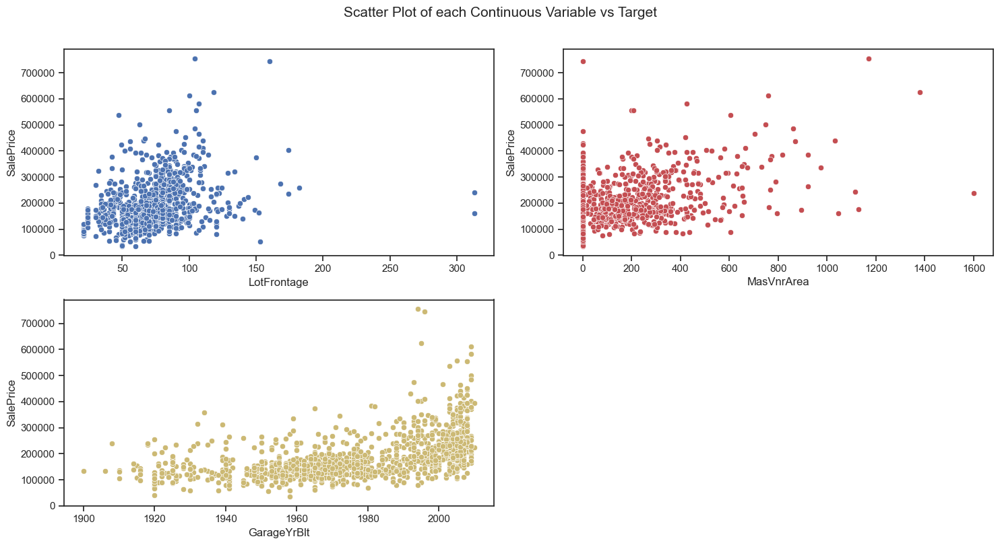

Number of All Scatter Plots = 6


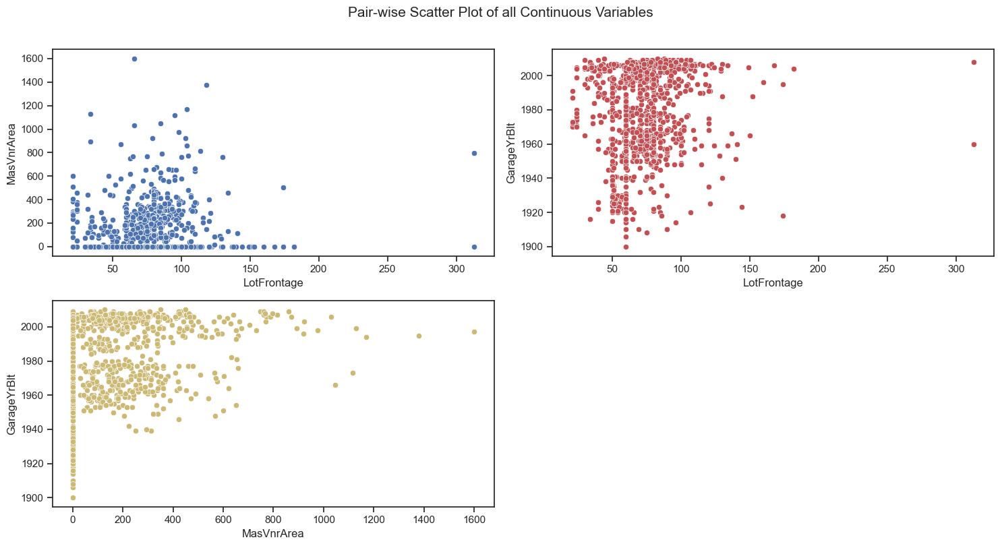

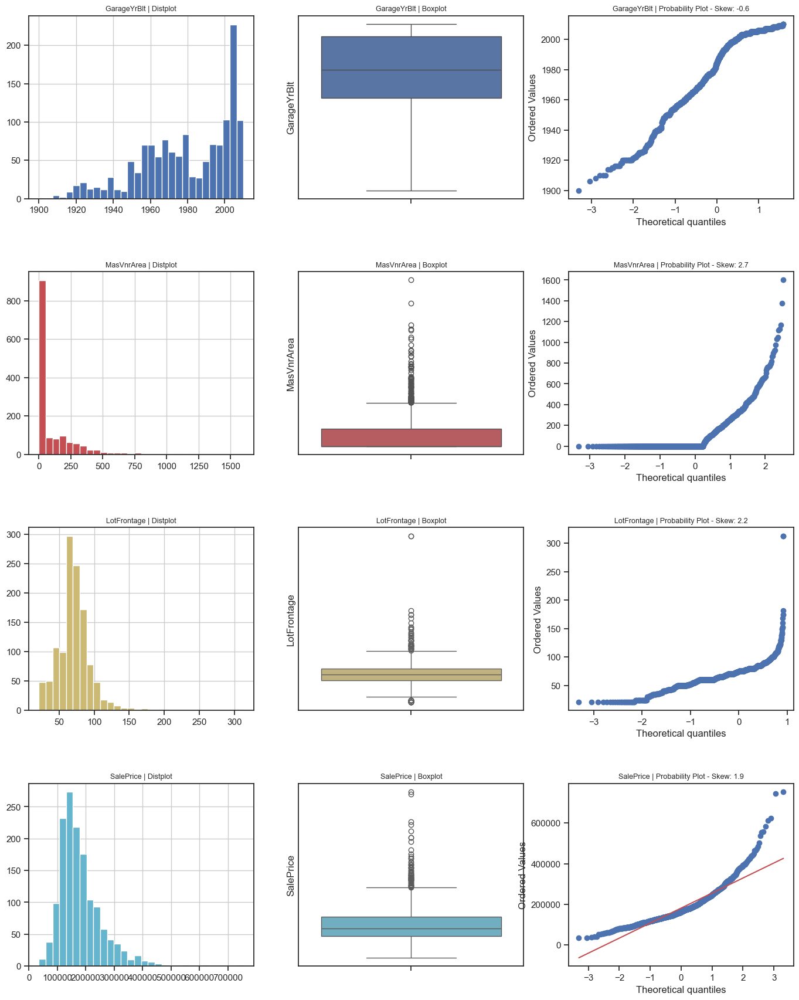

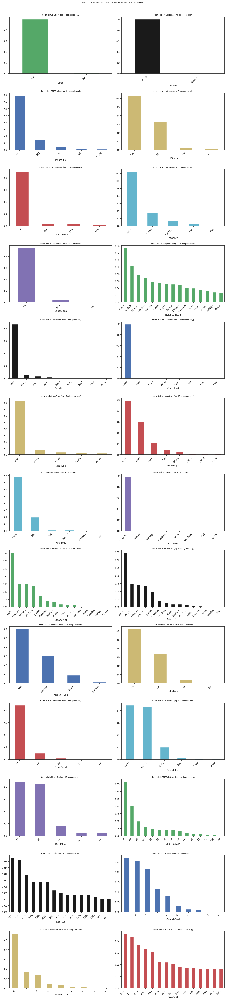

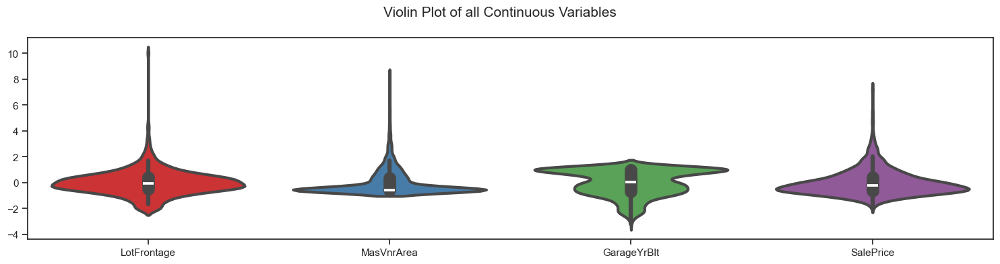

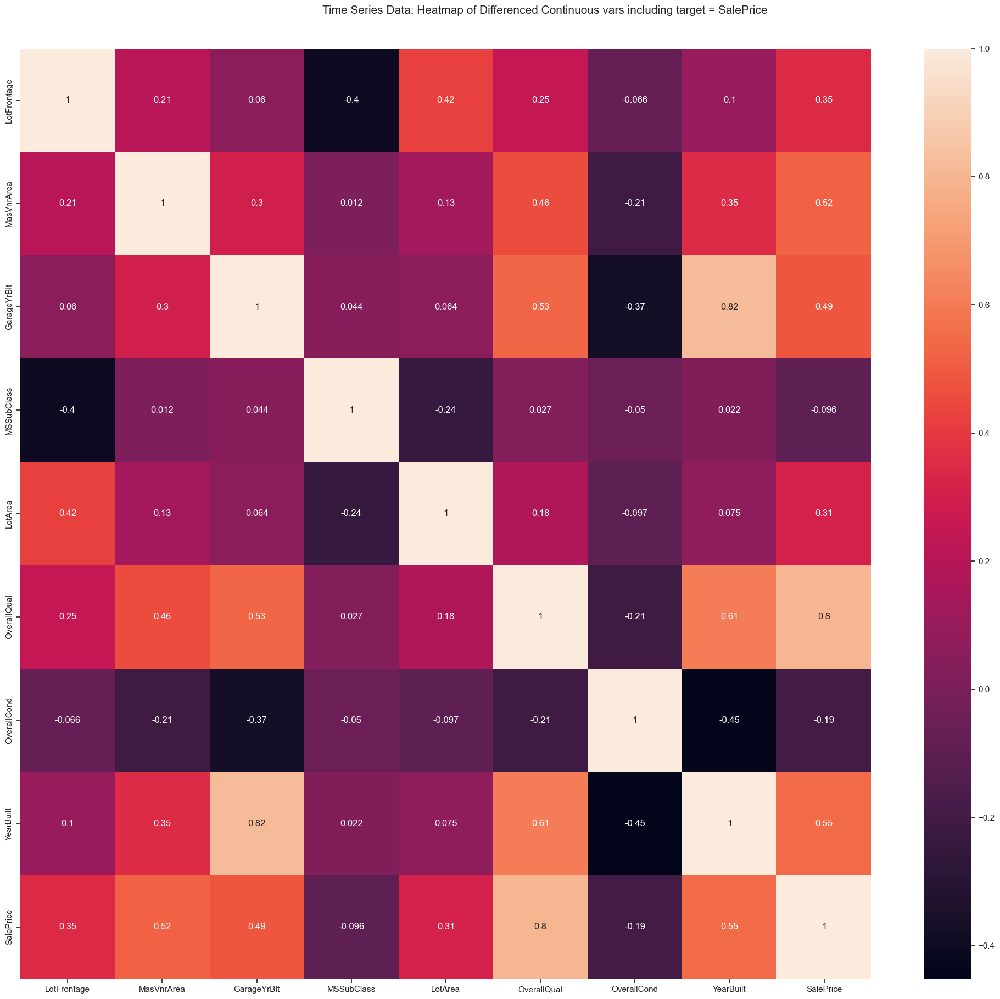

Could not draw some Time Series plots. agg function failed [how->mean,dtype->object]


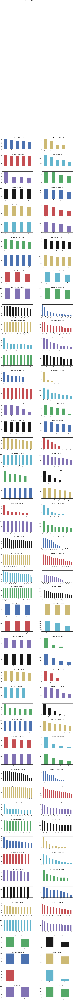

All Plots done
Time to run AutoViz = 23 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [133]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
AV = AutoViz_Class()
dft = AV.AutoViz("", depVar='SalePrice', dfte=HP_train_df, verbose=1)

## Data Cleansing  
The first thing to do, is to **check for empty values.**  
### **Checking for missing values**

In [6]:
#if nan exists in columns
pd.set_option('display.max_rows', None)
HP_train_df.isna().any()

Id               False
MSSubClass       False
MSZoning         False
LotFrontage       True
LotArea          False
Street           False
Alley             True
LotShape         False
LandContour      False
Utilities        False
LotConfig        False
LandSlope        False
Neighborhood     False
Condition1       False
Condition2       False
BldgType         False
HouseStyle       False
OverallQual      False
OverallCond      False
YearBuilt        False
YearRemodAdd     False
RoofStyle        False
RoofMatl         False
Exterior1st      False
Exterior2nd      False
MasVnrType        True
MasVnrArea        True
ExterQual        False
ExterCond        False
Foundation       False
BsmtQual          True
BsmtCond          True
BsmtExposure      True
BsmtFinType1      True
BsmtFinSF1       False
BsmtFinType2      True
BsmtFinSF2       False
BsmtUnfSF        False
TotalBsmtSF      False
Heating          False
HeatingQC        False
CentralAir       False
Electrical        True
1stFlrSF   

In [7]:
#columns type, if mix types type is object
HP_train_df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [8]:
# count, any nan , col type
HP_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

Let's translate all the empty values to np.NaN values (Pandas works best with these values).

In [9]:
pd.reset_option('display.max_rows')
# replace all empty values to np.NaN values
#cpy the original df
HP_train_df_cp = HP_train_df.copy()
HP_train_df_cp.replace('', np.NaN, inplace=True)
HP_train_df_cp.fillna(np.NaN, inplace=True)
HP_train_df_cp

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,

In [10]:
# detect np.NaN or None values in the copy of df
print(f'There are {len(np.where(HP_train_df_cp.isnull())[0])} empty values in the dataframe')
print(np.where(HP_train_df_cp.isnull()))

There are 7829 empty values in the dataframe
(array([   0,    0,    0, ..., 1459, 1459, 1459], dtype=int64), array([ 6, 57, 72, ..., 72, 73, 74], dtype=int64))


In [11]:
# Set the maximum number of rows to display to None (which means 'no limit')
pd.set_option('display.max_rows', None)
# using .isna()
HP_train_df_cp.isna().sum()
# using .isnull()
HP_train_df_cp.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType        872
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [12]:
#missing data
total = HP_train_df_cp.isnull().sum().sort_values(ascending=False)
percent = (HP_train_df_cp.isnull().sum()/HP_train_df_cp.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
MasVnrType,872,0.597260
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479


**droping features**

id

PoolQC, MiscFeature, Alley, Fence, MasVnrType (more then 60% missing)

FireplaceQu - we can remove this feature since it has alot of missing values, Since the most important information regarding Fireplaces is expressed by'Fireplaces'

we can see that 'GarageX' and 'BsmtX' variables have the same number of missing data, the missing data refers to the same set of observations probably. Since the most important information regarding garages is expressed by 'GarageCars' and considering that we are just talking about 5% of missing data, we will delete the mentioned 'GarageX' variables. The same logic applies to 'BsmtX' variables.

In [13]:
pd.reset_option('display.max_rows')
HP_train_df_cp = HP_train_df_cp.drop(columns=['PoolQC', 'MiscFeature','Alley','Fence','MasVnrType','FireplaceQu','GarageYrBlt','GarageCond','GarageType','GarageFinish','GarageQual','BsmtFinType2','BsmtExposure','BsmtQual','BsmtCond','BsmtFinType1','Id'])
HP_train_df_cp

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,706,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,2,548,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,978,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,2,460,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,486,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,2,608,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,216,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,3,642,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,655,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,3,836,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,0.0,TA,TA,PConc,0,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,2,460,Y,0,40,0,0,0,0,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,119.0,TA,TA,CBlock,790,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,2,500,Y,349,0,0,0,0,0,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,0.0,Ex,Gd,Stone,275,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,1,252,Y,0,60,0,0,0,0,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,49,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,1,240,Y,366,0,112,0,0,0,0,4,2010,WD,Normal,142125


### categorical and numerical features 

In [14]:
# determine categorical and numerical features
t = HP_train_df_cp['SalePrice'].copy()
X = HP_train_df_cp.drop(['SalePrice'], axis=1)

numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object', 'bool']).columns
all_cols = np.array(X.columns)

print('Numerical Cols:', numerical_cols)
print('Categorical Cols:', categorical_cols)
print('All Cols:', all_cols)

Numerical Cols: Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object')
Categorical Cols: Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'PavedDrive', 'SaleType', 

In [15]:
# Set the maximum number of rows to display to None (which means 'no limit')
pd.set_option('display.max_rows', None)
# using .isna()
HP_train_df_cp.isna().sum()
# using .isnull()
HP_train_df_cp.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
KitchenQual        0
TotRmsAbvGrd       0
Functional   

**filling missing values**
Electrical - we will put the most common value
MasVnrArea - we will put the mean value
LotFrontage - we will put the mean value

In [16]:
def fill_na_mean(df, column_name):
    df_not_null = df[~df[column_name].isnull()]
    df[column_name].fillna(df_not_null[column_name].mean(), inplace=True) 

fill_na_mean(HP_train_df_cp,'MasVnrArea')

fill_na_mean(HP_train_df_cp,'LotFrontage')


C:\Users\97250.ADIRB\AppData\Local\Temp\ipykernel_11368\1877540105.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column_name].fillna(df_not_null[column_name].mean(), inplace=True)


In [17]:
HP_train_df_cp['Electrical'].value_counts()

Electrical
SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: count, dtype: int64

In [18]:
# import px and create pie charts for each categorical feature
import plotly.express as px
def create_pie_chart_of_count(df, column_name):
    #create mask of all null values in provided column name
    mask = df[column_name].isnull()
    df_not_null = df[~mask]
    # create pie chart using px.pie
    fig = px.pie(
                  df_not_null.groupby([column_name]).size().reset_index(name='count'),
                  names=column_name,
                  values='count')
    fig.show()

create_pie_chart_of_count(HP_train_df_cp, 'Electrical')

91.4% is SBrkr so that the value we will put instead of the missing one.

In [19]:
HP_train_df_cp['Electrical'].fillna('SBrkr', inplace=True)
print(HP_train_df_cp['Electrical'].isna().sum())

0


C:\Users\97250.ADIRB\AppData\Local\Temp\ipykernel_11368\2600062418.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





## **Correlation Matrix**
numerical features

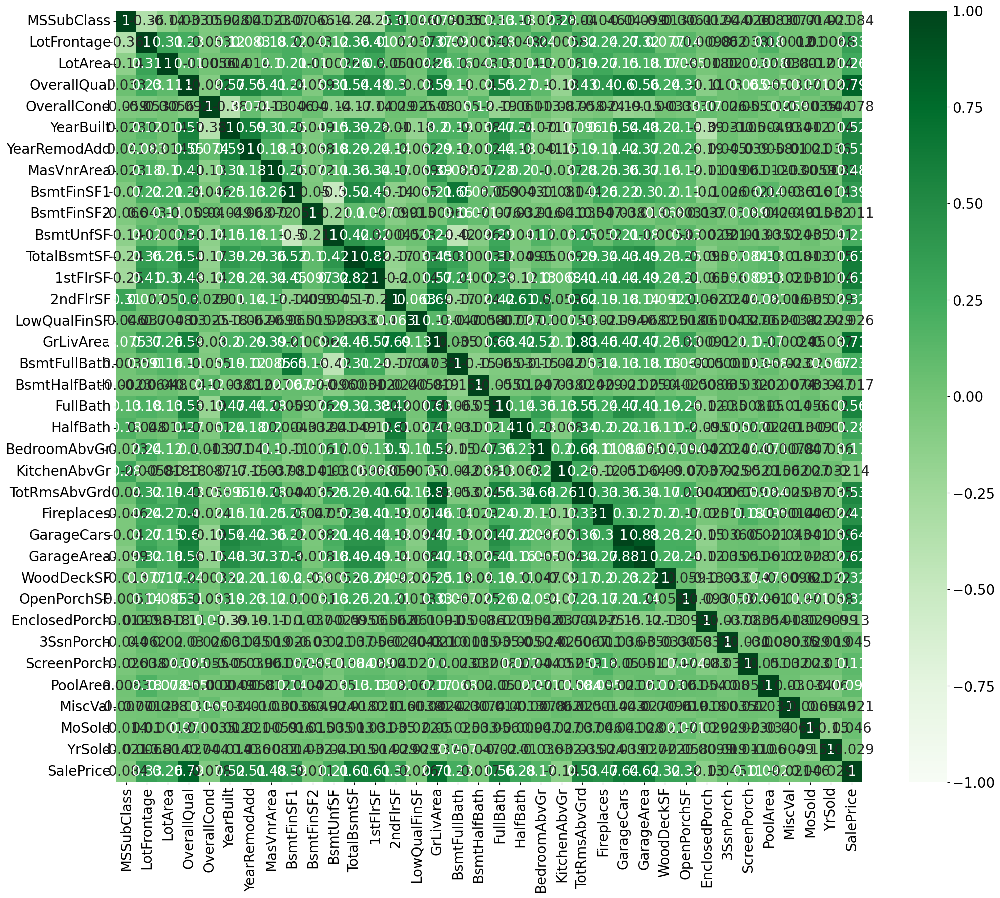

In [20]:
plt.figure(figsize=(24,20))
cor = HP_train_df_cp.select_dtypes(exclude=['object']).corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Greens, vmin=-1, vmax=1)
plt.show()

**This code will filter out the columns with low correlation (-0.15 to 0.15) with SalePrice and display a heatmap of the remaining features.**

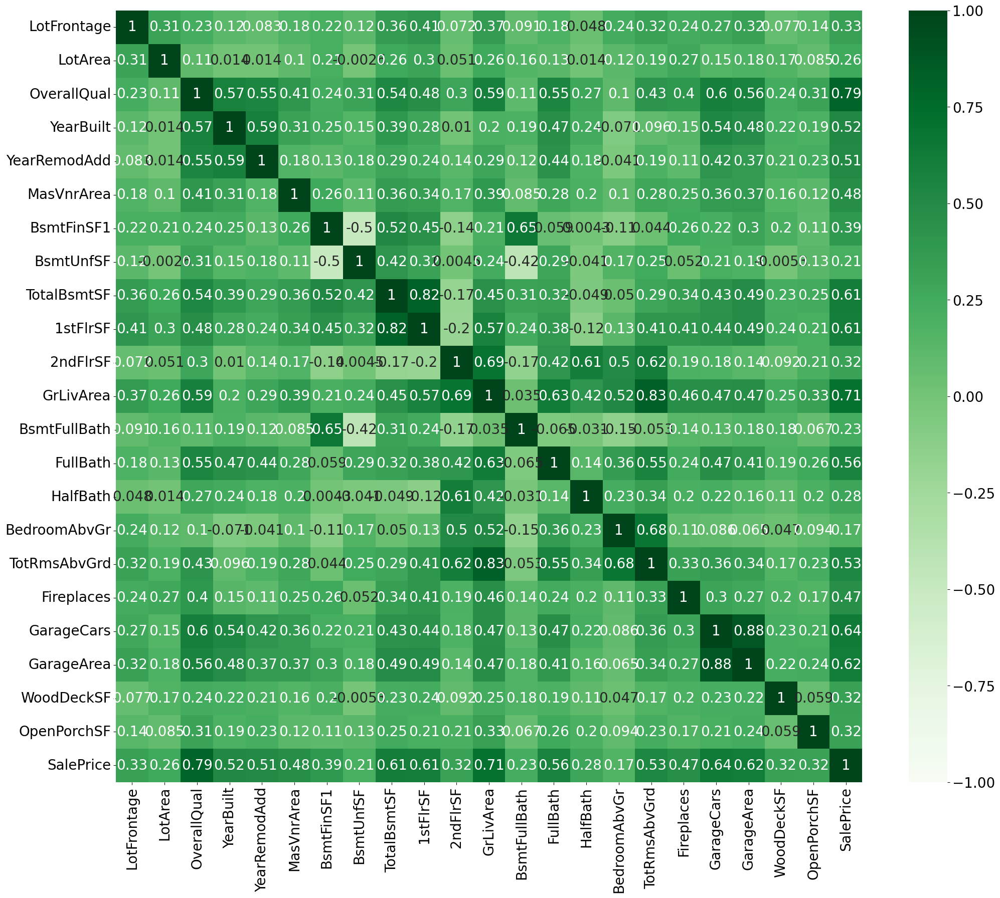

In [21]:
# Step 1: Compute the correlation matrix
cor = HP_train_df_cp.select_dtypes(exclude=['object']).corr()

# Step 2: Identify columns with low correlation with SalePrice
low_cor_columns = cor.index[(cor['SalePrice'] > -0.15) & (cor['SalePrice'] < 0.15)].tolist()

# Step 3: Drop these columns from the DataFrame
HP_train_df_cp_filtered = HP_train_df_cp.drop(columns=low_cor_columns)

# Step 4: Visualize the filtered correlation matrix
plt.figure(figsize=(24,20))
cor_filtered = HP_train_df_cp_filtered.select_dtypes(exclude=['object']).corr()
sns.heatmap(cor_filtered, annot=True, cmap=plt.cm.Greens, vmin=-1, vmax=1)
plt.show()

## **Feature ENGINEERING**

Let's create some new features combining the ones that we already have. These could help us to increase the performance of the model!

In [22]:
HP_train_df_cp_filtered["SqFtPerRoom"] = HP_train_df_cp["GrLivArea"] / (HP_train_df_cp["TotRmsAbvGrd"] +
                                                       HP_train_df_cp["FullBath"] +
                                                       HP_train_df_cp["HalfBath"] +
                                                       HP_train_df_cp["KitchenAbvGr"])


HP_train_df_cp_filtered['Total_Home_Quality'] = HP_train_df_cp['OverallQual'] + HP_train_df_cp['OverallCond']

HP_train_df_cp_filtered['Total_Bathrooms'] = (HP_train_df_cp['FullBath'] + (0.5 * HP_train_df_cp['HalfBath']) +
                               HP_train_df_cp['BsmtFullBath'] + (0.5 * HP_train_df_cp['BsmtHalfBath']))

HP_train_df_cp_filtered["HighQualSF"] = HP_train_df_cp["1stFlrSF"] + HP_train_df_cp["2ndFlrSF"]


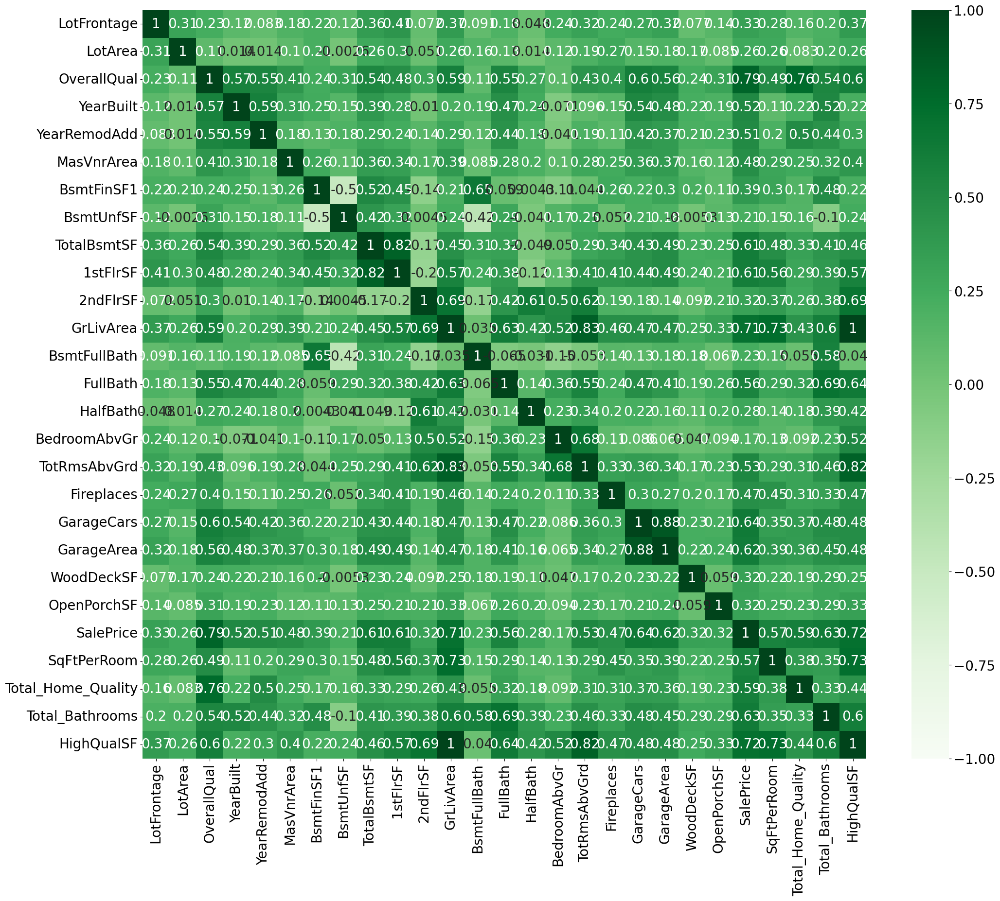

In [23]:
# Step 4: Visualize the filtered correlation matrix
plt.figure(figsize=(24,20))
cor_filtered = HP_train_df_cp_filtered.select_dtypes(exclude=['object']).corr()
sns.heatmap(cor_filtered, annot=True, cmap=plt.cm.Greens, vmin=-1, vmax=1)
plt.show()

we decieded to add the following features : 

`SqFtPerRoom` which is the sum of the following: `TotRmsAbvGrd` + `FullBath` + `HalfBath` + `KitchenAbvGr`

`Total_Home_Quality` which is the sum of the following: `OverallQual` + `OverallCond` 

`Total_Bathrooms` which is the sum of the following: `FullBath"` + 0.5 * `HalfBath` + `BsmtFullBath` + 0.5 * `BsmtHalfBath`

`HighQualSF` which is the sum of the following: `1stFlrSF` + `2ndFlrSF`

## Cross-Validation
**KFold**


In [24]:
from sklearn.model_selection import KFold
pd.reset_option('display.max_rows')
# divide the data to features and target
t = HP_train_df_cp_filtered['SalePrice'].copy()
X = HP_train_df_cp_filtered.drop(['SalePrice'], axis=1)
print('t')
display(t)
print()
print('X')
display(X)

t


0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64


X


,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleType,SaleCondition,SqFtPerRoom,Total_Home_Quality,Total_Bathrooms,HighQualSF
0,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,706,150,856,GasA,Ex,Y,SBrkr,856,854,1710,1,2,1,3,Gd,8,Typ,0,2,548,Y,0,61,WD,Normal,142.500000,12,3.5,1710
1,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,978,284,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,2,0,3,TA,6,Typ,1,2,460,Y,298,0,WD,Normal,140.222222,14,2.5,1262
2,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,486,434,920,GasA,Ex,Y,SBrkr,920,866,1786,1,2,1,3,Gd,6,Typ,1,2,608,Y,0,42,WD,Normal,178.600000,12,3.5,1786
3,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,216,540,756,GasA,Gd,Y,SBrkr,961,756,1717,1,1,0,3,Gd,7,Typ,1,3,642,Y,0,35,WD,Abnorml,190.777778,12,2.0,1717
4,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,655,490,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,2,1,4,Gd,9,Typ,1,3,836,Y,192,84,WD,Normal,169.076923,13,3.5,2198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,1999,2000,Gable,CompShg,VinylSd,VinylSd,0.0,TA,TA,PConc,0,953,953,GasA,Ex,Y,SBrkr,953,694,1647,0,2,1,3,TA,7,Typ,1,2,460,Y,0,40,WD,Normal,149.727273,11,2.5,1647
1456,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,1978,1988,Gable,CompShg,Plywood,Plywood,119.0,TA,TA,CBlock,790,589,1542,GasA,TA,Y,SBrkr,2073,0,2073,1,2,0,3,TA,7,Min1,2,2,500,Y,349,0,WD,Normal,207.300000,12,3.0,2073
1457,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,1941,2006,Gable,CompShg,CemntBd,CmentBd,0.0,Ex,Gd,Stone,275,877,1152,GasA,Ex,Y,SBrkr,1188,1152,2340,0,2,0,4,Gd,9,Typ,2,1,252,Y,0,60,WD,Normal,195.000000,16,2.0,2340
1458,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,1950,1996,Hip,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,49,0,1078,GasA,Gd,Y,FuseA,1078,0,1078,1,1,0,2,Gd,5,Typ,0,1,240,Y,366,0,WD,Normal,154.000000,11,2.0,1078


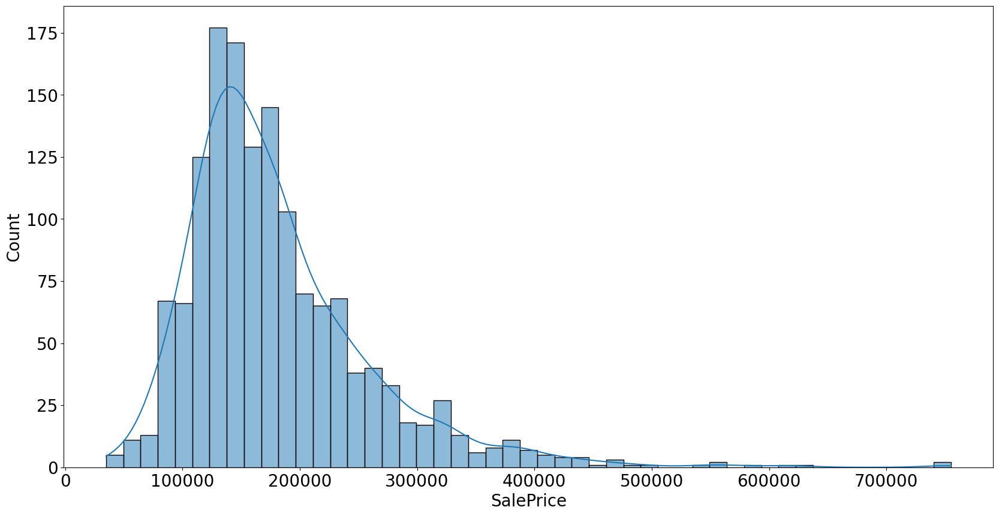

In [25]:
# Review the Target value histogram
sns.histplot(t, kde=True)
plt.show()

In [26]:
import plotly.graph_objects as go
def get_cv_score_and_loss(X, t, model, transformer=None,
                          k=None,
                          p=None,
                          show_score_loss_graphs=False,
                          use_rmse=False):
  
    scores_losses_df = pd.DataFrame(columns=['fold_id', 'split', 'score', 'loss'])

    if k is not None:
        cv = KFold(n_splits=k, shuffle=True, random_state=42)
    elif p is not None:
        cv = LeavePOut(p)
    else:
        raise ValueError('You need to specify k or p in order for the CV to work')

    for i, (train_ids, val_ids) in enumerate(cv.split(X)):
        # from index to record assignment
        X_train = X.loc[train_ids]
        t_train = t.loc[train_ids]
        X_val = X.loc[val_ids]
        t_val = t.loc[val_ids]

        # fit and predict
        model.fit(X_train, t_train)
        y_train = model.predict(X_train)
        y_val = model.predict(X_val)
        
        # calculate the loss (either MSE or RMSE)
        train_loss = mean_squared_error(t_train, y_train)
        val_loss = mean_squared_error(t_val, y_val)
        if use_rmse:
            train_loss = np.sqrt(train_loss)
            val_loss = np.sqrt(val_loss)

        # assign results into scores df
        scores_losses_df.loc[len(scores_losses_df)] = [i, 'train', model.score(X_train, t_train), train_loss]
        scores_losses_df.loc[len(scores_losses_df)] = [i, 'val', model.score(X_val, t_val), val_loss]

    # split into two dfs , val and train
    val_scores_losses_df = scores_losses_df[scores_losses_df['split'] == 'val']
    train_scores_losses_df = scores_losses_df[scores_losses_df['split'] == 'train']

    # calculate mean score and loss for train and validation across all models
    mean_val_score = val_scores_losses_df['score'].mean()
    mean_val_loss = val_scores_losses_df['loss'].mean()
    mean_train_score = train_scores_losses_df['score'].mean()
    mean_train_loss = train_scores_losses_df['loss'].mean()

    if show_score_loss_graphs:
        fig = px.line(scores_losses_df, x='fold_id', y='score', color='split', 
                      title=f'Mean Val Score: {mean_val_score:.2f}, Mean Train Score: {mean_train_score:.2f}')
        fig.show()
        fig = px.line(scores_losses_df, x='fold_id', y='loss', color='split', 
                      title=f'Mean Val Loss: {mean_val_loss:.2f}, Mean Train Loss: {mean_train_loss:.2f}')
        fig.show()
        display(scores_losses_df)

    return mean_val_score, mean_val_loss, mean_train_score, mean_train_loss



def evaluate_model_cv_MSE(X, model):
    val_score, val_loss, train_score, train_loss  = get_cv_score_and_loss(X,
                                                                         t,
                                                                         model, 
                                                                         transformer=ct,
                                                                         k=10,
                                                                         p=None,
                                                                         show_score_loss_graphs=True,
                                                                         use_rmse=False)
    
    print(f'mean cv val score: {val_score:.2f}\nmean cv val loss {val_loss:.2f}')
    print(f'mean cv train score: {train_score:.2f}\nmean cv train loss {train_loss:.2f}')

def evaluate_model_cv_RMSE(X, model):
    val_score, val_loss, train_score, train_loss  = get_cv_score_and_loss(X,
                                                                         t,
                                                                         model, 
                                                                         transformer=ct,
                                                                         k=10,
                                                                         p=None,
                                                                         show_score_loss_graphs=True,
                                                                         use_rmse=True)
    
    print(f'mean cv val score: {val_score:.2f}\nmean cv val loss {val_loss:.2f}')
    print(f'mean cv train score: {train_score:.2f}\nmean cv train loss {train_loss:.2f}')

In [27]:
# determine categorical and numerical features
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object', 'bool']).columns
all_cols = np.array(X.columns)

print('Numerical Cols:', numerical_cols)
print('Categorical Cols:', categorical_cols)
print('All Cols:', all_cols)

Numerical Cols: Index(['LotFrontage', 'LotArea', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'SqFtPerRoom',
       'Total_Home_Quality', 'Total_Bathrooms', 'HighQualSF'],
      dtype='object')
Categorical Cols: Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')
All Cols: ['MSZoning' 'LotFrontage' 'LotArea' 'Street' 'LotShape' 'LandContour'
 'U

In [28]:
# use column transformer to insert different transformers for each column
from sklearn.compose import ColumnTransformer

ct = ColumnTransformer([
                        ("encoding", OneHotEncoder(sparse_output=False, handle_unknown='ignore'),categorical_cols),
                        ("standard", StandardScaler(), numerical_cols)]
    )
model_pipe = make_pipeline(ct, SGDRegressor(random_state=1))



evaluate_model_cv_MSE(X, model_pipe)

,fold_id,split,score,loss
0,0,train,0.871348,7.708683e+08
1,0,val,0.863143,1.250410e+09
2,1,train,0.873619,7.983775e+08
3,1,val,0.862342,8.495647e+08
4,2,train,0.859143,8.996109e+08
5,2,val,0.889768,6.156939e+08
6,3,train,0.877418,7.490695e+08
7,3,val,0.852828,1.175369e+09
8,4,train,0.879734,7.744980e+08
9,4,val,0.676533,1.647587e+09


mean cv val score: 0.81
mean cv val loss 1162876630.78
mean cv train score: 0.87
mean cv train loss 819888947.55


## **Feature Selection**

In [29]:
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.model_selection import RepeatedKFold

numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object', 'bool']).columns
all_cols = categorical_cols.tolist() + numerical_cols.tolist()
ct_enc_std = ColumnTransformer([
            ("encoding", OrdinalEncoder(), categorical_cols),
            ("standard", MinMaxScaler(), numerical_cols)])

X_encoded = pd.DataFrame(ct_enc_std.fit_transform(X, t), columns=all_cols)

def feature_selection_fig(selector):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=[i for i in range(1, len(selector.feature_names_in_) + 1)]
                             , y=selector.cv_results_['mean_test_score']))
    fig.update_xaxes(title_text="Number of features selected")
    fig.update_yaxes(title_text="Cross validation R2 score")
    fig.show()


**Backward Feature Selection**

SGD

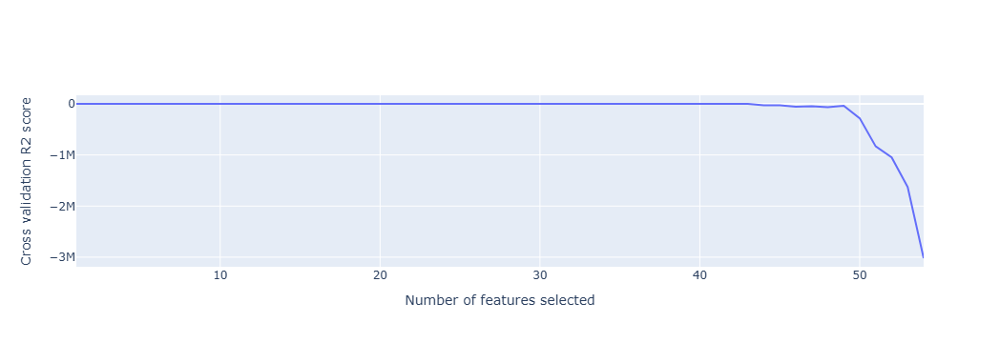

,Street,LandSlope,Condition2,BldgType,RoofStyle,RoofMatl,ExterQual,CentralAir,KitchenQual,Functional,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,SqFtPerRoom,Total_Home_Quality,Total_Bathrooms,HighQualSF
0,1.0,0.0,2.0,0.0,1.0,1.0,2.0,1.0,2.0,6.0,0.033420,0.666667,0.949275,0.883333,0.122500,0.125089,0.064212,0.140098,0.119780,0.413559,0.259231,0.333333,0.500000,0.000000,0.50,0.386460,0.000000,0.111517,0.219229,0.588235,0.5,0.259231
1,1.0,0.0,2.0,0.0,1.0,1.0,3.0,1.0,3.0,6.0,0.038795,0.555556,0.753623,0.433333,0.000000,0.173281,0.121575,0.206547,0.212942,0.000000,0.174830,0.000000,0.333333,0.333333,0.50,0.324401,0.347725,0.000000,0.210765,0.705882,0.3,0.174830
2,1.0,0.0,2.0,0.0,1.0,1.0,2.0,1.0,2.0,6.0,0.046507,0.666667,0.934783,0.866667,0.101250,0.086109,0.185788,0.150573,0.134465,0.419370,0.273549,0.333333,0.333333,0.333333,0.50,0.428773,0.000000,0.076782,0.353367,0.588235,0.5,0.273549
3,1.0,0.0,2.0,0.0,1.0,1.0,3.0,1.0,2.0,6.0,0.038561,0.666667,0.311594,0.333333,0.000000,0.038271,0.231164,0.123732,0.143873,0.366102,0.260550,0.333333,0.416667,0.333333,0.75,0.452750,0.000000,0.063985,0.398617,0.588235,0.2,0.260550
4,1.0,0.0,2.0,0.0,1.0,1.0,2.0,1.0,2.0,6.0,0.060576,0.777778,0.927536,0.833333,0.218750,0.116052,0.209760,0.187398,0.186095,0.509927,0.351168,0.333333,0.583333,0.333333,0.75,0.589563,0.224037,0.153565,0.317982,0.647059,0.5,0.351168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.0,0.0,2.0,0.0,1.0,1.0,3.0,1.0,3.0,6.0,0.030929,0.555556,0.920290,0.833333,0.000000,0.000000,0.407962,0.155974,0.142038,0.336077,0.247362,0.000000,0.416667,0.333333,0.50,0.324401,0.000000,0.073126,0.246084,0.529412,0.3,0.247362
1456,1.0,0.0,2.0,0.0,1.0,1.0,3.0,1.0,3.0,2.0,0.055505,0.555556,0.768116,0.633333,0.074375,0.139972,0.252140,0.252373,0.399036,0.000000,0.327619,0.333333,0.416667,0.666667,0.50,0.352609,0.407235,0.000000,0.460009,0.588235,0.4,0.327619
1457,1.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,2.0,6.0,0.036187,0.666667,0.500000,0.933333,0.000000,0.048724,0.375428,0.188543,0.195961,0.557869,0.377920,0.000000,0.583333,0.666667,0.25,0.177715,0.000000,0.109689,0.414306,0.823529,0.2,0.377920
1458,1.0,0.0,2.0,0.0,3.0,1.0,3.0,1.0,2.0,6.0,0.039342,0.444444,0.565217,0.766667,0.000000,0.008682,0.000000,0.176432,0.170721,0.000000,0.140166,0.333333,0.250000,0.000000,0.25,0.169252,0.427071,0.000000,0.261960,0.529412,0.2,0.140166


In [30]:
selector_BW_sgd = RFECV(
    SGDRegressor(random_state=1),
    cv=RepeatedKFold(n_splits=5, n_repeats=10, random_state=42)
    ).fit(X_encoded, t)

feature_selection_fig(selector_BW_sgd)

X_Selected_BW_sgd = X_encoded.loc[:, selector_BW_sgd.support_]

display(X_encoded.loc[:, selector_BW_sgd.support_])

Cross Validation with Backward Feature Selection For SGDRegressor


C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1616: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1616: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1616: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1616: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing ma

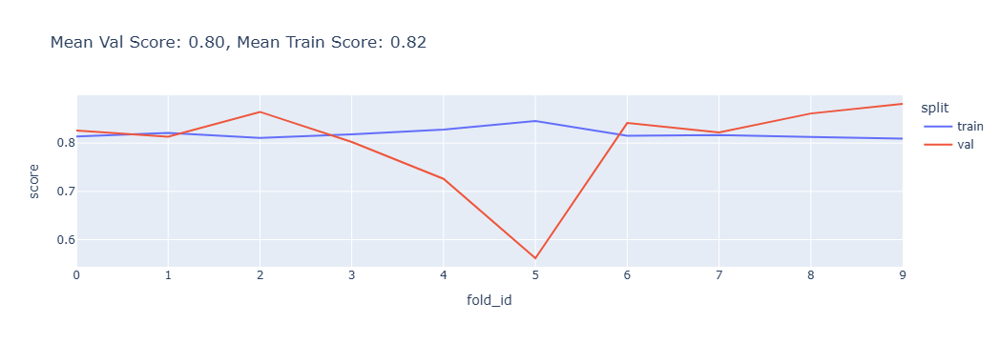

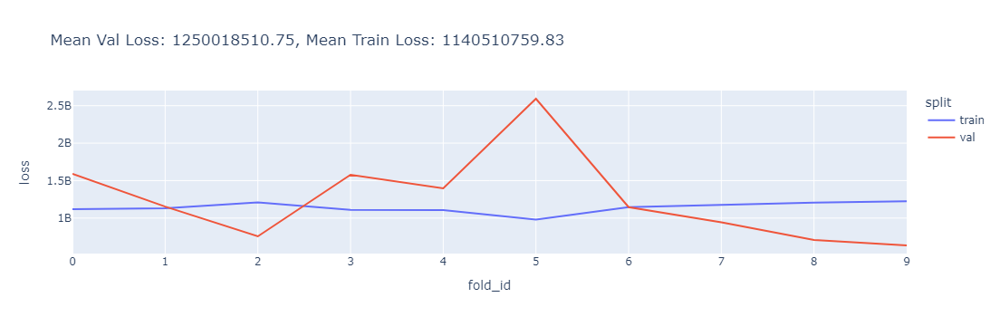

,fold_id,split,score,loss
0,0,train,0.813569,1.117076e+09
1,0,val,0.825949,1.590242e+09
2,1,train,0.821044,1.130502e+09
3,1,val,0.813132,1.153264e+09
4,2,train,0.810608,1.209587e+09
5,2,val,0.864629,7.561074e+08
6,3,train,0.818332,1.110130e+09
7,3,val,0.802348,1.578512e+09
8,4,train,0.828050,1.107337e+09
9,4,val,0.725924,1.396011e+09


mean cv val score: 0.80
mean cv val loss 1250018510.75
mean cv train score: 0.82
mean cv train loss 1140510759.83


In [31]:
print('Cross Validation with Backward Feature Selection For SGDRegressor')
evaluate_model_cv_MSE(X_Selected_BW_sgd, selector_BW_sgd)

linear regression

In [32]:
selector_BW_lr = RFECV(
    LinearRegression(),
    cv=RepeatedKFold(n_splits=5, n_repeats=10, random_state=42)
    ).fit(X_encoded, t)

feature_selection_fig(selector_BW_lr)

X_Selected_BW_lr = X_encoded.loc[:, selector_BW_lr.support_]

display(X_encoded.loc[:, selector_BW_lr.support_])

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,SqFtPerRoom,Total_Home_Quality,Total_Bathrooms,HighQualSF
0,3.0,1.0,3.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,1.0,1.0,12.0,13.0,2.0,4.0,2.0,1.0,0.0,1.0,4.0,2.0,6.0,2.0,8.0,4.0,0.150685,0.033420,0.666667,0.949275,0.883333,0.122500,0.125089,0.064212,0.140098,0.119780,0.413559,0.259231,0.333333,0.666667,0.5,0.375,0.500000,0.000000,0.50,0.386460,0.000000,0.111517,0.219229,0.588235,0.5,0.259231
1,3.0,1.0,3.0,3.0,0.0,2.0,0.0,24.0,1.0,2.0,0.0,2.0,1.0,1.0,8.0,8.0,3.0,4.0,1.0,1.0,0.0,1.0,4.0,3.0,6.0,2.0,8.0,4.0,0.202055,0.038795,0.555556,0.753623,0.433333,0.000000,0.173281,0.121575,0.206547,0.212942,0.000000,0.174830,0.000000,0.666667,0.0,0.375,0.333333,0.333333,0.50,0.324401,0.347725,0.000000,0.210765,0.705882,0.3,0.174830
2,3.0,1.0,0.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,1.0,1.0,12.0,13.0,2.0,4.0,2.0,1.0,0.0,1.0,4.0,2.0,6.0,2.0,8.0,4.0,0.160959,0.046507,0.666667,0.934783,0.866667,0.101250,0.086109,0.185788,0.150573,0.134465,0.419370,0.273549,0.333333,0.666667,0.5,0.375,0.333333,0.333333,0.50,0.428773,0.000000,0.076782,0.353367,0.588235,0.5,0.273549
3,3.0,1.0,0.0,3.0,0.0,0.0,0.0,6.0,2.0,2.0,0.0,5.0,1.0,1.0,13.0,15.0,3.0,4.0,0.0,1.0,2.0,1.0,4.0,2.0,6.0,2.0,8.0,0.0,0.133562,0.038561,0.666667,0.311594,0.333333,0.000000,0.038271,0.231164,0.123732,0.143873,0.366102,0.260550,0.333333,0.333333,0.0,0.375,0.416667,0.333333,0.75,0.452750,0.000000,0.063985,0.398617,0.588235,0.2,0.260550
4,3.0,1.0,0.0,3.0,0.0,2.0,0.0,15.0,2.0,2.0,0.0,5.0,1.0,1.0,12.0,13.0,2.0,4.0,2.0,1.0,0.0,1.0,4.0,2.0,6.0,2.0,8.0,4.0,0.215753,0.060576,0.777778,0.927536,0.833333,0.218750,0.116052,0.209760,0.187398,0.186095,0.509927,0.351168,0.333333,0.666667,0.5,0.500,0.583333,0.333333,0.75,0.589563,0.224037,0.153565,0.317982,0.647059,0.5,0.351168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,3.0,1.0,3.0,3.0,0.0,4.0,0.0,8.0,2.0,2.0,0.0,5.0,1.0,1.0,12.0,13.0,3.0,4.0,2.0,1.0,0.0,1.0,4.0,3.0,6.0,2.0,8.0,4.0,0.140411,0.030929,0.555556,0.920290,0.833333,0.000000,0.000000,0.407962,0.155974,0.142038,0.336077,0.247362,0.000000,0.666667,0.5,0.375,0.416667,0.333333,0.50,0.324401,0.000000,0.073126,0.246084,0.529412,0.3,0.247362
1456,3.0,1.0,3.0,3.0,0.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,1.0,1.0,9.0,10.0,3.0,4.0,1.0,1.0,4.0,1.0,4.0,3.0,2.0,2.0,8.0,4.0,0.219178,0.055505,0.555556,0.768116,0.633333,0.074375,0.139972,0.252140,0.252373,0.399036,0.000000,0.327619,0.333333,0.666667,0.0,0.375,0.416667,0.666667,0.50,0.352609,0.407235,0.000000,0.460009,0.588235,0.4,0.327619
1457,3.0,1.0,3.0,3.0,0.0,4.0,0.0,6.0,2.0,2.0,0.0,5.0,1.0,1.0,5.0,5.0,0.0,2.0,4.0,1.0,0.0,1.0,4.0,2.0,6.0,2.0,8.0,4.0,0.154110,0.036187,0.666667,0.500000,0.933333,0.000000,0.048724,0.375428,0.188543,0.195961,0.557869,0.377920,0.000000,0.666667,0.0,0.500,0.583333,0.666667,0.25,0.177715,0.000000,0.109689,0.414306,0.823529,0.2,0.377920
1458,3.0,1.0,3.0,3.0,0.0,4.0,0.0,12.0,2.0,2.0,0.0,2.0,3.0,1.0,8.0,8.0,3.0,4.0,1.0,1.0,2.0,1.0,0.0,2.0,6.0,2.0,8.0,4.0,0.160959,0.039342,0.444444,0.565217,0.766667,0.000000,0.008682,0.000000,0.176432,0.170721,0.000000,0.140166,0.333333,0.333333,0.0,0.250,0.250000,0.000000,0.25,0.169252,0.427071,0.000000,0.261960,0.529412,0.2,0.140166


In [33]:
print('Cross Validation with Backward Feature Selection For LinearRegression')
evaluate_model_cv_MSE(X_Selected_BW_lr, selector_BW_lr)

Cross Validation with Backward Feature Selection For LinearRegression


,fold_id,split,score,loss
0,0,train,0.832571,1.003216e+09
1,0,val,0.851522,1.356589e+09
2,1,train,0.837730,1.025094e+09
3,1,val,0.823044,1.092093e+09
4,2,train,0.832723,1.068348e+09
5,2,val,0.878357,6.794306e+08
6,3,train,0.840097,9.771281e+08
7,3,val,0.795476,1.633400e+09
8,4,train,0.848784,9.738118e+08
9,4,val,0.656795,1.748124e+09


mean cv val score: 0.78
mean cv val loss 1345023515.96
mean cv train score: 0.84
mean cv train loss 1012776402.07


**Forward Feature Selection**

SGD

In [34]:
from sklearn.feature_selection import SequentialFeatureSelector
# Sequential Feature Selection for SGDRegressor
selector_FW_sgd = SequentialFeatureSelector(
    SGDRegressor(random_state=1),
    n_features_to_select="auto",
    direction='forward',
    cv=RepeatedKFold(n_splits=5, n_repeats=10, random_state=42)
).fit(X_encoded, t)

X_Selected_FW_sgd = X_encoded.loc[:, selector_FW_sgd.get_support()]

display(X_Selected_FW_sgd)

C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1616: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1616: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1616: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.

C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1616: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing ma

,LotShape,Utilities,LandSlope,BldgType,RoofStyle,ExterQual,Heating,CentralAir,KitchenQual,PavedDrive,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,BsmtFullBath,HalfBath,Fireplaces,GarageCars,WoodDeckSF,Total_Home_Quality,Total_Bathrooms,HighQualSF
0,3.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,2.0,2.0,0.033420,0.666667,0.949275,0.883333,0.122500,0.125089,0.140098,0.119780,0.259231,0.333333,0.5,0.000000,0.50,0.000000,0.588235,0.5,0.259231
1,3.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,3.0,2.0,0.038795,0.555556,0.753623,0.433333,0.000000,0.173281,0.206547,0.212942,0.174830,0.000000,0.0,0.333333,0.50,0.347725,0.705882,0.3,0.174830
2,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,2.0,2.0,0.046507,0.666667,0.934783,0.866667,0.101250,0.086109,0.150573,0.134465,0.273549,0.333333,0.5,0.333333,0.50,0.000000,0.588235,0.5,0.273549
3,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,2.0,2.0,0.038561,0.666667,0.311594,0.333333,0.000000,0.038271,0.123732,0.143873,0.260550,0.333333,0.0,0.333333,0.75,0.000000,0.588235,0.2,0.260550
4,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,2.0,2.0,0.060576,0.777778,0.927536,0.833333,0.218750,0.116052,0.187398,0.186095,0.351168,0.333333,0.5,0.333333,0.75,0.224037,0.647059,0.5,0.351168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,3.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,3.0,2.0,0.030929,0.555556,0.920290,0.833333,0.000000,0.000000,0.155974,0.142038,0.247362,0.000000,0.5,0.333333,0.50,0.000000,0.529412,0.3,0.247362
1456,3.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,3.0,2.0,0.055505,0.555556,0.768116,0.633333,0.074375,0.139972,0.252373,0.399036,0.327619,0.333333,0.0,0.666667,0.50,0.407235,0.588235,0.4,0.327619
1457,3.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,2.0,2.0,0.036187,0.666667,0.500000,0.933333,0.000000,0.048724,0.188543,0.195961,0.377920,0.000000,0.0,0.666667,0.25,0.000000,0.823529,0.2,0.377920
1458,3.0,0.0,0.0,0.0,3.0,3.0,1.0,1.0,2.0,2.0,0.039342,0.444444,0.565217,0.766667,0.000000,0.008682,0.176432,0.170721,0.140166,0.333333,0.0,0.000000,0.25,0.427071,0.529412,0.2,0.140166


In [35]:
print('Cross Validation with Forward Feature Selection For SGDRegressor')
evaluate_model_cv_MSE(X_Selected_FW_sgd, SGDRegressor(random_state=42))

Cross Validation with Forward Feature Selection For SGDRegressor


,fold_id,split,score,loss
0,0,train,0.815834,1.103503e+09
1,0,val,0.830138,1.551969e+09
2,1,train,0.819940,1.137475e+09
3,1,val,0.824285,1.084433e+09
4,2,train,0.814618,1.183975e+09
5,2,val,0.871452,7.179971e+08
6,3,train,0.819794,1.101191e+09
7,3,val,0.808361,1.530493e+09
8,4,train,0.827361,1.111772e+09
9,4,val,0.734427,1.352704e+09


mean cv val score: 0.81
mean cv val loss 1198052759.73
mean cv train score: 0.82
mean cv train loss 1136902425.55


linear regression

In [36]:
# Sequential Feature Selection for LinearRegression
selector_FW_lr = SequentialFeatureSelector(
    LinearRegression(),
    n_features_to_select="auto",
    direction='forward',
    cv=RepeatedKFold(n_splits=5, n_repeats=10, random_state=42)
).fit(X_encoded, t)

X_Selected_FW_lr = X_encoded.loc[:, selector_FW_lr.get_support()]

display(X_Selected_FW_lr)

,Street,LotShape,Utilities,Neighborhood,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,ExterQual,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleCondition,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFullBath,Fireplaces,GarageCars,WoodDeckSF,Total_Home_Quality,HighQualSF
0,1.0,3.0,0.0,5.0,0.0,5.0,1.0,1.0,12.0,2.0,0.0,1.0,2.0,6.0,2.0,4.0,0.033420,0.666667,0.949275,0.883333,0.122500,0.333333,0.000000,0.50,0.000000,0.588235,0.259231
1,1.0,3.0,0.0,24.0,0.0,2.0,1.0,1.0,8.0,3.0,0.0,1.0,3.0,6.0,2.0,4.0,0.038795,0.555556,0.753623,0.433333,0.000000,0.000000,0.333333,0.50,0.347725,0.705882,0.174830
2,1.0,0.0,0.0,5.0,0.0,5.0,1.0,1.0,12.0,2.0,0.0,1.0,2.0,6.0,2.0,4.0,0.046507,0.666667,0.934783,0.866667,0.101250,0.333333,0.333333,0.50,0.000000,0.588235,0.273549
3,1.0,0.0,0.0,6.0,0.0,5.0,1.0,1.0,13.0,3.0,2.0,1.0,2.0,6.0,2.0,0.0,0.038561,0.666667,0.311594,0.333333,0.000000,0.333333,0.333333,0.75,0.000000,0.588235,0.260550
4,1.0,0.0,0.0,15.0,0.0,5.0,1.0,1.0,12.0,2.0,0.0,1.0,2.0,6.0,2.0,4.0,0.060576,0.777778,0.927536,0.833333,0.218750,0.333333,0.333333,0.75,0.224037,0.647059,0.351168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.0,3.0,0.0,8.0,0.0,5.0,1.0,1.0,12.0,3.0,0.0,1.0,3.0,6.0,2.0,4.0,0.030929,0.555556,0.920290,0.833333,0.000000,0.000000,0.333333,0.50,0.000000,0.529412,0.247362
1456,1.0,3.0,0.0,14.0,0.0,2.0,1.0,1.0,9.0,3.0,4.0,1.0,3.0,2.0,2.0,4.0,0.055505,0.555556,0.768116,0.633333,0.074375,0.333333,0.666667,0.50,0.407235,0.588235,0.327619
1457,1.0,3.0,0.0,6.0,0.0,5.0,1.0,1.0,5.0,0.0,0.0,1.0,2.0,6.0,2.0,4.0,0.036187,0.666667,0.500000,0.933333,0.000000,0.000000,0.666667,0.25,0.000000,0.823529,0.377920
1458,1.0,3.0,0.0,12.0,0.0,2.0,3.0,1.0,8.0,3.0,2.0,1.0,2.0,6.0,2.0,4.0,0.039342,0.444444,0.565217,0.766667,0.000000,0.333333,0.000000,0.25,0.427071,0.529412,0.140166


In [37]:
print('Cross Validation with Forward Feature Selection For LinearRegression')
evaluate_model_cv_MSE(X_Selected_FW_lr, LinearRegression())

Cross Validation with Forward Feature Selection For LinearRegression


,fold_id,split,score,loss
0,0,train,0.823759,1.056016e+09
1,0,val,0.853998,1.333963e+09
2,1,train,0.829659,1.076081e+09
3,1,val,0.820166,1.109852e+09
4,2,train,0.824187,1.122861e+09
5,2,val,0.881270,6.631580e+08
6,3,train,0.830626,1.035002e+09
7,3,val,0.810099,1.516613e+09
8,4,train,0.840469,1.027357e+09
9,4,val,0.685069,1.604110e+09


mean cv val score: 0.81
mean cv val loss 1163134826.23
mean cv train score: 0.83
mean cv train loss 1071554142.12


**in conclusion we can see that forward feature selection is better overall moving on we will continue using SGDRegressor, we will use the `selector_FW_sgd`, now we can make regularization techniques to check if there will be improvement.**

this is the selected method with RMSE

In [38]:
evaluate_model_cv_RMSE(X_Selected_FW_sgd, SGDRegressor(random_state=42))

,fold_id,split,score,loss
0,0,train,0.815834,33219.014883
1,0,val,0.830138,39395.042271
2,1,train,0.819940,33726.472042
3,1,val,0.824285,32930.723141
4,2,train,0.814618,34408.932040
5,2,val,0.871452,26795.467222
6,3,train,0.819794,33184.195464
7,3,val,0.808361,39121.516871
8,4,train,0.827361,33343.244606
9,4,val,0.734427,36779.119257


mean cv val score: 0.81
mean cv val loss 33824.71
mean cv train score: 0.82
mean cv train loss 33704.67


# Hyper parameters search with Regularization Techniques

In [39]:
from sklearn.model_selection import GridSearchCV

hyper_parameters = {
    'penalty': ['l2', 'l1', 'elasticnet'],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'learning_rate': ['constant'],
    'eta0': [0.01, 0.1, 1]
}

gs_model = GridSearchCV(
    SGDRegressor(random_state=1, max_iter= 40000),
    hyper_parameters,
    cv=RepeatedKFold(n_splits=5, n_repeats=10, random_state=42)
).fit(X_Selected_FW_sgd,t)


print('Accuracy score for classification:')
print('gs_model', gs_model.best_score_)
print('best params', gs_model.best_params_)

Accuracy score for classification:
gs_model 0.7891756621015246
best params {'alpha': 0.001, 'eta0': 0.01, 'learning_rate': 'constant', 'penalty': 'l2'}


In [40]:
evaluate_model_cv_RMSE(X_Selected_FW_sgd,gs_model)

,fold_id,split,score,loss
0,0,train,0.563427,51145.881804
1,0,val,0.719641,50611.664696
2,1,train,0.806271,34983.186825
3,1,val,0.803968,34782.436326
4,2,train,0.787498,36839.942831
5,2,val,0.846458,29284.767657
6,3,train,0.632961,47359.071167
7,3,val,0.657849,52273.622238
8,4,train,0.815408,34478.166564
9,4,val,0.697542,39250.210530


mean cv val score: 0.76
mean cv val loss 38078.89
mean cv train score: 0.77
mean cv train loss 37776.23


we can see that using Regularization Techniques did not help we got worse scores oveall so we will continue without it. only use `X_Selected_FW_sgd` with `SGDRegressor`

## **Test Preprocessing**

In [41]:
HP_test_df = pd.read_csv("test.csv")
HP_test_df.reset_index(drop=True, inplace=True)
pd.set_option('display.max_rows', None)
HP_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

In [42]:
HP_test_df_cp = HP_test_df.copy()
HP_test_df_cp.replace('', np.NaN, inplace=True)
HP_test_df_cp.fillna(np.NaN, inplace=True)

droping features test

In [43]:
pd.reset_option('display.max_rows')
HP_test_df_cp = HP_test_df_cp.drop(columns=['PoolQC', 'MiscFeature','Alley','Fence','MasVnrType','FireplaceQu','GarageYrBlt','GarageCond','GarageType','GarageFinish','GarageQual','BsmtFinType2','BsmtExposure','BsmtQual','BsmtCond','BsmtFinType1','Id'])
HP_test_df_cp

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RH,80.0,11622,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,0.0,TA,TA,CBlock,468.0,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,1.0,730.0,Y,140,0,0,0,120,0,0,6,2010,WD,Normal
1,20,RL,81.0,14267,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,108.0,TA,TA,CBlock,923.0,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,1.0,312.0,Y,393,36,0,0,0,0,12500,6,2010,WD,Normal
2,60,RL,74.0,13830,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,0.0,TA,TA,PConc,791.0,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,2.0,482.0,Y,212,34,0,0,0,0,0,3,2010,WD,Normal
3,60,RL,78.0,9978,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,20.0,TA,TA,PConc,602.0,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,2.0,470.0,Y,360,36,0,0,0,0,0,6,2010,WD,Normal
4,120,RL,43.0,5005,Pave,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,0.0,Gd,TA,PConc,263.0,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,2.0,506.0,Y,0,82,0,0,144,0,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,160,RM,21.0,1936,Pave,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,0.0,TA,TA,CBlock,0.0,0.0,546.0,546.0,GasA,Gd,Y,SBrkr,546,546,0,1092,0.0,0.0,1,1,3,1,TA,5,Typ,0,0.0,0.0,Y,0,0,0,0,0,0,0,6,2006,WD,Normal
1455,160,RM,21.0,1894,Pave,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,0.0,TA,TA,CBlock,252.0,0.0,294.0,546.0,GasA,TA,Y,SBrkr,546,546,0,1092,0.0,0.0,1,1,3,1,TA,6,Typ,0,1.0,286.0,Y,0,24,0,0,0,0,0,4,2006,WD,Abnorml
1456,20,RL,160.0,20000,Pave,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,0.0,TA,TA,CBlock,1224.0,0.0,0.0,1224.0,GasA,Ex,Y,SBrkr,1224,0,0,1224,1.0,0.0,1,0,4,1,TA,7,Typ,1,2.0,576.0,Y,474,0,0,0,0,0,0,9,2006,WD,Abnorml
1457,85,RL,62.0,10441,Pave,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,5,5,1992,1992,Gable,CompShg,HdBoard,Wd Shng,0.0,TA,TA,PConc,337.0,0.0,575.0,912.0,GasA,TA,Y,SBrkr,970,0,0,970,0.0,1.0,1,0,3,1,TA,6,Typ,0,0.0,0.0,Y,80,32,0,0,0,0,700,7,2006,WD,Normal


In [44]:
pd.set_option('display.max_rows', None)
# using .isna()
HP_test_df_cp.isna().sum()
# using .isnull()
HP_test_df_cp.isnull().sum()

MSSubClass         0
MSZoning           4
LotFrontage      227
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          2
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        1
Exterior2nd        1
MasVnrArea        15
ExterQual          0
ExterCond          0
Foundation         0
BsmtFinSF1         1
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       2
BsmtHalfBath       2
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
KitchenQual        1
TotRmsAbvGrd       0
Functional   

**filling missing values**

MSZoning, Electrical, Utilities, Exterior1st, Exterior2nd, BsmtFullBath, BsmtHalfBath, KitchenQual, Functional, SaleType - we will put the most common value

MasVnrArea, LotFrontage, BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF  - we will put the mean value

GarageCars, GarageArea - we will put value 0

In [45]:
def fill_na_most_common_value(df, column_names):
  for column_name in column_names:
    df[column_name].fillna(df[column_name].mode()[0], inplace=True) 

def fill_na_with_0(df, column_names):
  for column_name in column_names:
    df[column_name].fillna(0, inplace=True) 

fill_na_mean(HP_test_df_cp,'MasVnrArea')
fill_na_mean(HP_test_df_cp,'LotFrontage')
fill_na_mean(HP_test_df_cp,'BsmtFinSF1')
fill_na_mean(HP_test_df_cp,'BsmtFinSF2')
fill_na_mean(HP_test_df_cp,'BsmtUnfSF')
fill_na_mean(HP_test_df_cp,'TotalBsmtSF')

fill_na_most_common_value(HP_test_df_cp, ['Electrical', 'MSZoning', 'Utilities', 'Exterior1st', 'Exterior2nd', 'BsmtFullBath', 'BsmtHalfBath', 'KitchenQual', 'Functional', 'SaleType'])
fill_na_with_0(HP_test_df_cp,['GarageCars', 'GarageArea'])

C:\Users\97250.ADIRB\AppData\Local\Temp\ipykernel_11368\1877540105.py:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\97250.ADIRB\AppData\Local\Temp\ipykernel_11368\2219046853.py:7: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(val

In [46]:
# using .isna()
HP_test_df_cp.isna().sum()
# using .isnull()
HP_test_df_cp.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
GarageCars       0
GarageArea       0
PavedDrive       0
WoodDeckSF  

**correlation filter test**

In [47]:
HP_test_df_cp_filtered = HP_test_df_cp.drop(columns=low_cor_columns)

**Feature ENGINEERING Test**

In [48]:
HP_test_df_cp_filtered["SqFtPerRoom"] = HP_test_df_cp["GrLivArea"] / (HP_test_df_cp["TotRmsAbvGrd"] +
                                                       HP_test_df_cp["FullBath"] +
                                                       HP_test_df_cp["HalfBath"] +
                                                       HP_test_df_cp["KitchenAbvGr"])


HP_test_df_cp_filtered['Total_Home_Quality'] = HP_test_df_cp['OverallQual'] + HP_test_df_cp['OverallCond']

HP_test_df_cp_filtered['Total_Bathrooms'] = (HP_test_df_cp['FullBath'] + (0.5 * HP_test_df_cp['HalfBath']) +
                               HP_test_df_cp['BsmtFullBath'] + (0.5 * HP_test_df_cp['BsmtHalfBath']))

HP_test_df_cp_filtered["HighQualSF"] = HP_test_df_cp["1stFlrSF"] + HP_test_df_cp["2ndFlrSF"]

In [49]:
numerical_cols = HP_test_df_cp_filtered.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = HP_test_df_cp_filtered.select_dtypes(include=['object', 'bool']).columns
all_cols = categorical_cols.tolist() + numerical_cols.tolist()
ct_enc_std = ColumnTransformer([
            ("encoding", OrdinalEncoder(), categorical_cols),
            ("standard", MinMaxScaler(), numerical_cols)])


test_encoded = pd.DataFrame(ct_enc_std.fit_transform(HP_test_df_cp_filtered), columns=all_cols)

test_Selected_FW_sgd = test_encoded.loc[:, selector_FW_sgd.get_support()]



## model training and submission

In [50]:
pd.reset_option('display.max_rows')
model = SGDRegressor(random_state=42)
model.fit(X_Selected_FW_sgd, t)
# create the submission file
submission = pd.read_csv("sample_submission.csv")
submission['SalePrice'] = model.predict(test_Selected_FW_sgd)
submission.to_csv('submission.csv', index=False)
display(submission)

,Id,SalePrice
0,1461,99533.132379
1,1462,168458.361217
2,1463,165800.085569
3,1464,195160.369602
4,1465,180839.505585
...,...,...
1454,2915,61710.368839
1455,2916,60201.586016
1456,2917,163693.483241
1457,2918,98465.306874


## **Screenshots**

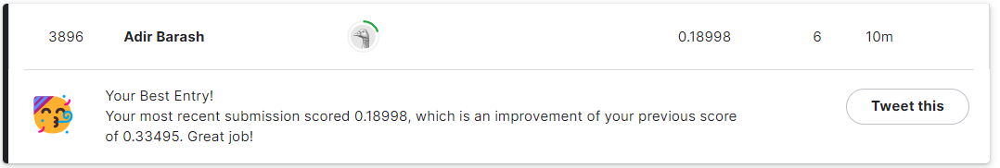

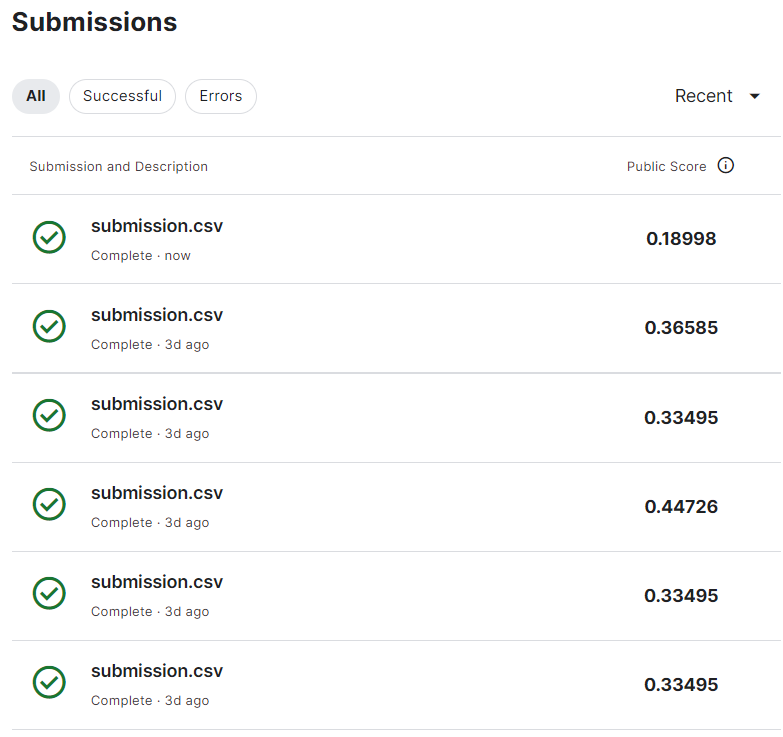

## **Summery**

**Data Exploration and Cleaning:**


We began by analyzing the data through graphs and visualizations.
We preprocessed the data by checking for missing values.
Features with over 60% missing values were dropped.
Categorical and numerical features were addressed:
Missing values were filled using the mean for numerical features and the most common value for categorical features.
A correlation matrix helped identify features with low correlation to the target variable, which were then filtered out.


**Feature Engineering:**

**New informative features were created:**


SqFtPerRoom: sum of TotRmsAbvGrd, FullBath, HalfBath, and KitchenAbvGr


Total_Home_Quality: sum of OverallQual and OverallCond


Total_Bathrooms: sum of FullBath, half the value of HalfBath, BsmtFullBath, and half the value of BsmtHalfBath


HighQualSF: sum of 1stFlrSF and 2ndFlrSF


**Model Selection and Evaluation:**

K-fold cross-validation was used to evaluate the model's performance.


Feature selection techniques were explored:


Backward Feature Selection with SGD or linear regression


Forward Feature Selection with SGD or linear regression


Based on the results, Forward Feature Selection with SGD was chosen.


Hyperparameter tuning with GridSearch was attempted for regularization techniques. However, they resulted in lower performance, so the model proceeded without regularization.


The final model used Forward Feature Selection with a SGD regressor.


**Final Steps:**

The test data was preprocessed.


The model was trained on the prepared data.


The final model was submitted for evaluation.

## **References**

https://www.kaggle.com/code/marto24/beginners-prediction-top3

https://www.kaggle.com/code/pmarcelino/comprehensive-data-exploration-with-python#'SalePrice',-her-buddies-and-her-interests

# Exercise 4

**TL;DR**

We applied four regression algorithms—Locally Weighted Linear Regression (LWLR), K-nearest Neighbors (KNN), Decision Trees, and Support Vector Machines (SVM)—to a dataset. We compared the performance of these models using Root Mean Square Error (RMSE) as a metric. After hyperparameter tuning and using Principal Component Analysis (PCA) for dimensionality reduction, we identified the best-performing model. We also experimented with various ensemble methods to enhance the model's accuracy. The final model selection incorporated PCA for better performance.

In [51]:
# clone the lwlr repo from github
!git clone https://github.com/qiaochen/CourseExercises

fatal: destination path 'CourseExercises' already exists and is not an empty directory.


In [78]:
from CourseExercises.lwlr import LWLR
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
import graphviz 
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.decomposition import PCA

# *Experiments with PCA, different models, ensembles and hyperparameters search.*

**LWLR**

In [53]:
# get best k for lwlr (show the calculation of this sell)
hyper_parameters = {'k': list(range(1, 10))}
arr_X= np.asarray(X_Selected_FW_sgd)

gs_lwlr_model = GridSearchCV(LWLR(k=1), hyper_parameters, 
                           scoring='r2').fit(arr_X, t)

print('R2 score for regression:')
print('gs_lw_model', gs_lwlr_model.best_score_)
print('best params', gs_lwlr_model.best_params_)
print()

R2 score for regression:
gs_lw_model 0.8193986785482867
best params {'k': 3}



In [91]:
# 1. Extract the best model
best_lwlr_model = gs_lwlr_model.best_estimator_

# 2. Predict using the best model (here we use the same data for demonstration purposes)
predictions = best_lwlr_model.predict(arr_X)

# 3. Calculate RMSE
rmse = np.sqrt(mean_squared_error(t, predictions))

print(f'RMSE for the best LWLR model: {rmse}')

RMSE for the best LWLR model: 25261.973966327456


**KNN**

In [54]:
# run KNN on the dataset and find best K by R2 and accuracy
hyper_parameters = {'n_neighbors': list(range(1, 20))}

gs_neigh_model = GridSearchCV(KNeighborsRegressor(
    n_neighbors=5, weights='distance'), 
    hyper_parameters).fit(X_Selected_FW_sgd, t)

print('R2 score for regression:')
print('gs_neigh_model', gs_neigh_model.best_score_)
print('best params', gs_neigh_model.best_params_)
print()

C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning:

Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "C:\Users\97250.ADIRB\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


R2 score for regression:
gs_neigh_model 0.719227768172906
best params {'n_neighbors': 7}



In [55]:
evaluate_model_cv_RMSE(X_Selected_FW_sgd, gs_neigh_model)

,fold_id,split,score,loss
0,0,train,0.999992,218.215401
1,0,val,0.664429,55371.388375
2,1,train,0.999996,161.941848
3,1,val,0.755557,38840.549874
4,2,train,0.999993,218.241314
5,2,val,0.757881,36774.217396
6,3,train,0.999992,218.241307
7,3,val,0.710207,48108.040615
8,4,train,0.999993,218.231520
9,4,val,0.701073,39020.389216


mean cv val score: 0.72
mean cv val loss 41839.86
mean cv train score: 1.00
mean cv train loss 192.60


**Decision Tree**

In [56]:
hyper_parameters = {'max_depth': list(range(1, 20)),
                    'min_samples_split': [2, 5, 10, 15, 20],
                    'min_samples_leaf': [1, 2, 4, 8, 12]}

# Initialize and fit the GridSearchCV with DecisionTreeRegressor
gs_tree_model = GridSearchCV(DecisionTreeRegressor(random_state=42), 
                             hyper_parameters).fit(X_Selected_FW_sgd, t)

# Print the results
print('R2 score for regression:')
print('gs_tree_model:', gs_tree_model.best_score_)
print('Best parameters:', gs_tree_model.best_params_)
print()

R2 score for regression:
gs_tree_model: 0.7888531343862871
Best parameters: {'max_depth': 19, 'min_samples_leaf': 2, 'min_samples_split': 10}



In [57]:
dt = DecisionTreeRegressor(max_depth=19, min_samples_leaf=2, random_state=42,min_samples_split=10 )
dt.fit(X_Selected_FW_sgd, t)

DecisionTreeRegressor(max_depth=19, min_samples_leaf=2, min_samples_split=10,
                      random_state=42)

In [58]:
features = X_Selected_FW_sgd.columns
dot_data = export_graphviz(dt, out_file=None, feature_names=features)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

**SVM**

In [59]:
# Define hyperparameters for tuning
param_grid = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
              'C': [0.1, 1, 10, 100],
              'gamma': ['scale', 'auto']}
# Initialize and fit the GridSearchCV with SVM (SVR)
gs_svm_model = GridSearchCV(SVR(),param_grid).fit(X_Selected_FW_sgd, t)

# Print the results
print('R2 score for regression:')
print('gs_svm_model:', gs_svm_model.best_score_)
print('Best parameters:', gs_svm_model.best_params_)
print()

R2 score for regression:
gs_svm_model: 0.5328672395512483
Best parameters: {'C': 100, 'gamma': 'scale', 'kernel': 'linear'}



In [60]:
evaluate_model_cv_RMSE(X_Selected_FW_sgd, gs_svm_model)

,fold_id,split,score,loss
0,0,train,0.549806,51937.622513
1,0,val,0.549471,64158.570383
2,1,train,0.552882,53146.345778
3,1,val,0.564999,51813.374345
4,2,train,0.543870,53973.720640
5,2,val,0.620617,46032.832681
6,3,train,0.555644,52108.972243
7,3,val,0.462597,65512.479579
8,4,train,0.547987,53952.758620
9,4,val,0.578351,46343.043072


mean cv val score: 0.55
mean cv val loss 52853.78
mean cv train score: 0.55
mean cv train loss 53172.29


# *PCA*

In [96]:
# Create a pipeline with PCA and SGDRegressor
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Ensure the data is standardized
    ('pca', PCA()),
    ('sgd', SGDRegressor(random_state=42))
])

# Define the parameter grid for the number of PCA components
param_grid = {
    'pca__n_components': np.arange(1, X_Selected_FW_sgd.shape[1] + 1)
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, scoring='r2', cv=5)
grid_search.fit(arr_X, t)

# Best number of components and model performance
best_n_components = grid_search.best_params_['pca__n_components']
best_score = grid_search.best_score_

print(f"Best number of PCA components: {best_n_components}")
print(f"Best Cross-Validation R2 score: {best_score:.4f}")

# Evaluate the best model on the training set
best_model_PCA = grid_search.best_estimator_

Best number of PCA components: 14
Best Cross-Validation R2 score: 0.8081


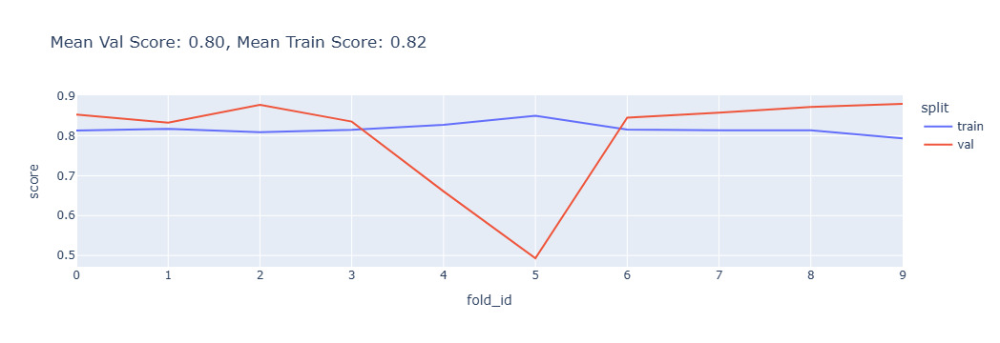

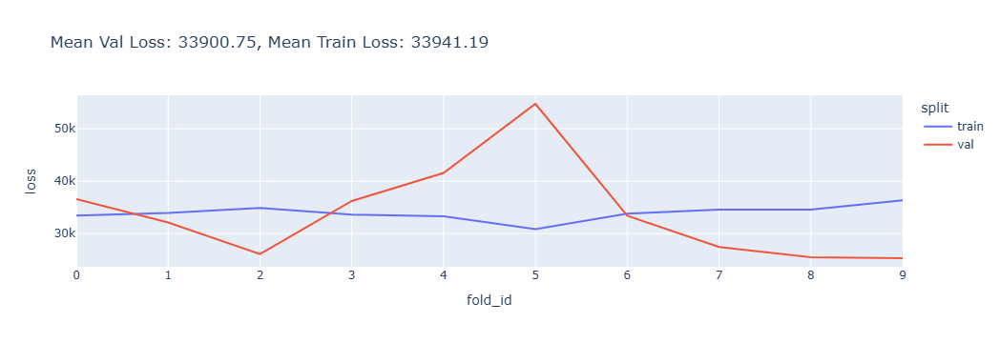

,fold_id,split,score,loss
0,0,train,0.813219,33454.060023
1,0,val,0.853380,36600.723533
2,1,train,0.817693,33936.280258
3,1,val,0.832957,32107.856341
4,2,train,0.809133,34914.272753
5,2,val,0.877999,26104.185631
6,3,train,0.814846,33636.753498
7,3,val,0.835714,36222.113732
8,4,train,0.827623,33317.888886
9,4,val,0.660716,41571.035801


mean cv val score: 0.80
mean cv val loss 33900.75
mean cv train score: 0.82
mean cv train loss 33941.19


In [97]:
evaluate_model_cv_RMSE(X_Selected_FW_sgd, best_model_PCA)

# Trying ensembles with the diffrent models

we will try diffrent ensembles (Bagging, nfold bagging, boosting) with the two best models we got so far:

`SGDRegressor(random_state=42)` and `best_model_PCA`

**nfold bagging**

PCA

In [63]:
# get score with nfold bagging
from sklearn.ensemble import BaggingRegressor

bagging_model_pca = BaggingRegressor(estimator=best_model_PCA.named_steps['sgd'],
                                   n_estimators=20, random_state=42,
                                   bootstrap=False).fit(X_Selected_FW_sgd, t)


evaluate_model_cv_RMSE(X_Selected_FW_sgd, bagging_model_pca)

,fold_id,split,score,loss
0,0,train,0.815060,33288.759810
1,0,val,0.830134,39395.434122
2,1,train,0.818942,33819.868725
3,1,val,0.822248,33121.008043
4,2,train,0.813220,34538.433513
5,2,val,0.868211,27131.205903
6,3,train,0.819305,33229.199756
7,3,val,0.806551,39305.835405
8,4,train,0.828810,33203.030283
9,4,val,0.731762,36963.142839


mean cv val score: 0.81
mean cv val loss 33874.12
mean cv train score: 0.82
mean cv train loss 33658.95


SGD

In [64]:
bagging_model_SGD = BaggingRegressor(
    estimator=SGDRegressor(random_state=42),
    n_estimators=20,
    random_state=42,
    bootstrap=False
).fit(X_Selected_FW_sgd,t)

In [65]:
evaluate_model_cv_RMSE(X_Selected_FW_sgd, bagging_model_SGD)

,fold_id,split,score,loss
0,0,train,0.815060,33288.759810
1,0,val,0.830134,39395.434122
2,1,train,0.818942,33819.868725
3,1,val,0.822248,33121.008043
4,2,train,0.813220,34538.433513
5,2,val,0.868211,27131.205903
6,3,train,0.819305,33229.199756
7,3,val,0.806551,39305.835405
8,4,train,0.828810,33203.030283
9,4,val,0.731762,36963.142839


mean cv val score: 0.81
mean cv val loss 33874.12
mean cv train score: 0.82
mean cv train loss 33658.95


**bootstrap bagging**

PCA

In [66]:
# get score with nfold bagging
from sklearn.ensemble import BaggingRegressor

bagging_model_pca_bootstrap = BaggingRegressor(estimator=best_model_PCA.named_steps['sgd'],
                                   n_estimators=20, random_state=42,
                                   bootstrap=True).fit(X_Selected_FW_sgd, t)


In [67]:
evaluate_model_cv_RMSE(X_Selected_FW_sgd, bagging_model_pca_bootstrap)

,fold_id,split,score,loss
0,0,train,0.812803,33491.239581
1,0,val,0.826141,39855.843068
2,1,train,0.815377,34151.130248
3,1,val,0.817373,33572.139568
4,2,train,0.811770,34672.258204
5,2,val,0.866912,27264.536332
6,3,train,0.817413,33402.720518
7,3,val,0.805004,39462.701876
8,4,train,0.826047,33469.848166
9,4,val,0.739980,36392.570608


mean cv val score: 0.81
mean cv val loss 34033.76
mean cv train score: 0.82
mean cv train loss 33899.43


SGD

In [68]:
bagging_model_SGD_bootstrap = BaggingRegressor(
    estimator=SGDRegressor(random_state=42),
    n_estimators=20,
    random_state=42,
    bootstrap=True
).fit(X_Selected_FW_sgd,t)

In [69]:
evaluate_model_cv_RMSE(X_Selected_FW_sgd, bagging_model_SGD_bootstrap)

,fold_id,split,score,loss
0,0,train,0.812803,33491.239581
1,0,val,0.826141,39855.843068
2,1,train,0.815377,34151.130248
3,1,val,0.817373,33572.139568
4,2,train,0.811770,34672.258204
5,2,val,0.866912,27264.536332
6,3,train,0.817413,33402.720518
7,3,val,0.805004,39462.701876
8,4,train,0.826047,33469.848166
9,4,val,0.739980,36392.570608


mean cv val score: 0.81
mean cv val loss 34033.76
mean cv train score: 0.82
mean cv train loss 33899.43


**Boosting**

SGD

In [70]:
# get score with ada boosting
from sklearn.ensemble import AdaBoostRegressor

ada_boost_model = AdaBoostRegressor(n_estimators=100, random_state=42).fit(X_Selected_FW_sgd, t)

print('R2 score for regressor:')
print('ada_boost_model', ada_boost_model.score(X_Selected_FW_sgd, t))

R2 score for regressor:
ada_boost_model 0.8729104987279553


In [71]:
evaluate_model_cv_RMSE(X_Selected_FW_sgd, ada_boost_model)

,fold_id,split,score,loss
0,0,train,0.874052,27471.155869
1,0,val,0.885172,32390.415802
2,1,train,0.890412,26311.420109
3,1,val,0.810108,34233.444890
4,2,train,0.879207,27775.294863
5,2,val,0.889896,24798.799599
6,3,train,0.862938,28940.505748
7,3,val,0.822547,37645.721657
8,4,train,0.878257,28000.130891
9,4,val,0.555075,47604.977833


mean cv val score: 0.80
mean cv val loss 34634.19
mean cv train score: 0.88
mean cv train loss 27898.49


# *Models Evaluation*

In [98]:
def evaluate_model_scores(models, X, y):
    """
    Evaluate multiple regression models using RMSE with cross-validation.

    Parameters:
    models (dict): A dictionary where keys are model names and values are model instances.
    X (array-like): Feature matrix.
    y (array-like): Target vector.

    Returns:
    pd.DataFrame: A DataFrame containing model names, cross-validated RMSE means, and standard deviations.
    """
    # Initialize lists to store results
    model_names = []
    cv_means = []
    cv_std = []

    # Initialize KFold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    
    # Evaluate each model
    for name, model in models.items():
        try:
            print(f"Evaluating model: {name}")
            model_names.append(name)
            # Perform cross-validation and compute negative RMSE
            scores = cross_val_score(model, X, y, scoring="neg_root_mean_squared_error", cv=kf, n_jobs=-1)
            print(f"Scores for {name}: {scores}")
            # Convert negative RMSE to positive and compute mean and std
            cv_means.append(-np.mean(scores))
            cv_std.append(np.std(scores))
        except Exception as e:
            print(f"Error evaluating model {name}: {e}")
            model_names.append(name)
            cv_means.append(np.nan)  # Append NaN if there's an error
            cv_std.append(np.nan)    # Append NaN if there's an error

    # Create a DataFrame with the results
    cv_results = pd.DataFrame({
        "CrossValMeans": cv_means,
        "CrossValErrors": cv_std,
        "Algorithms": model_names
    })
    
    return cv_results

def plot_model_scores(cv_results):
    """
    Plot the RMSE results of the models.

    Parameters:
    cv_results (pd.DataFrame): A DataFrame containing model names, cross-validated RMSE means, and standard deviations.
    """
    # Set the color palette
    palette = sns.color_palette("viridis", len(cv_results))
    
    # Create the plot
    plt.figure(figsize=(14, 8))
    cv_plot = sns.barplot(x="CrossValMeans", y="Algorithms", data=cv_results,
                          palette=palette, orient="h", errorbar=None)  # No error bars
    
    # Add labels and title
    cv_plot.set_xlabel("Root Mean Squared Error (RMSE)")
    cv_plot.set_title("Model Comparison: RMSE with Cross-Validation")
    
    # Add grid lines
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    
    # Annotate bars with RMSE values
    for patch in cv_plot.patches:
        plt.text(patch.get_width() + 0.02, patch.get_y() + patch.get_height()/2,
                 f'{patch.get_width():.4f}', va='center', ha='left', color='black')
    
    # Invert y-axis for better readability
    plt.gca().invert_yaxis()
    
    plt.show()

    
# Define your models in a dictionary
models = {
    'AdaBoost': ada_boost_model,
    'Bagging SGD Bootstrap': bagging_model_SGD_bootstrap,
    'Bagging PCA Bootstrap': bagging_model_pca_bootstrap,
    'Bagging SGD': bagging_model_SGD,
    'Bagging PCA': bagging_model_pca,
    'Best Model PCA': best_model_PCA,
    'SVM Model': gs_svm_model,
    'Decision Tree Model': gs_tree_model,
    'K-Neighbors Model': gs_neigh_model,
    'LWLR Model': gs_lwlr_model
}


Evaluating model: AdaBoost
Scores for AdaBoost: [-32390.41580241 -34233.44489009 -24798.79959904 -37645.72165687
 -47604.97783295 -38684.34050758 -35679.6462842  -34125.30713117
 -33807.6393932  -27371.57855139]
Evaluating model: Bagging SGD Bootstrap
Scores for Bagging SGD Bootstrap: [-39855.84306818 -33572.13956816 -27264.53633227 -39462.70187592
 -36392.57060827 -49375.31266608 -34276.23246095 -29154.12473127
 -26788.6780061  -24195.44781464]
Evaluating model: Bagging PCA Bootstrap
Scores for Bagging PCA Bootstrap: [-39855.84306818 -33572.13956816 -27264.53633227 -39462.70187592
 -36392.57060827 -49375.31266608 -34276.23246095 -29154.12473127
 -26788.6780061  -24195.44781464]
Evaluating model: Bagging SGD
Scores for Bagging SGD: [-39395.43412246 -33121.00804319 -27131.20590279 -39305.83540482
 -36963.14283875 -49698.14634745 -33822.14388639 -28903.06900603
 -26500.84743619 -23900.32582717]
Evaluating model: Bagging PCA
Scores for Bagging PCA: [-39395.43412246 -33121.00804319 -27131.

C:\Users\97250.ADIRB\AppData\Local\Temp\ipykernel_11368\3988987728.py:59: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




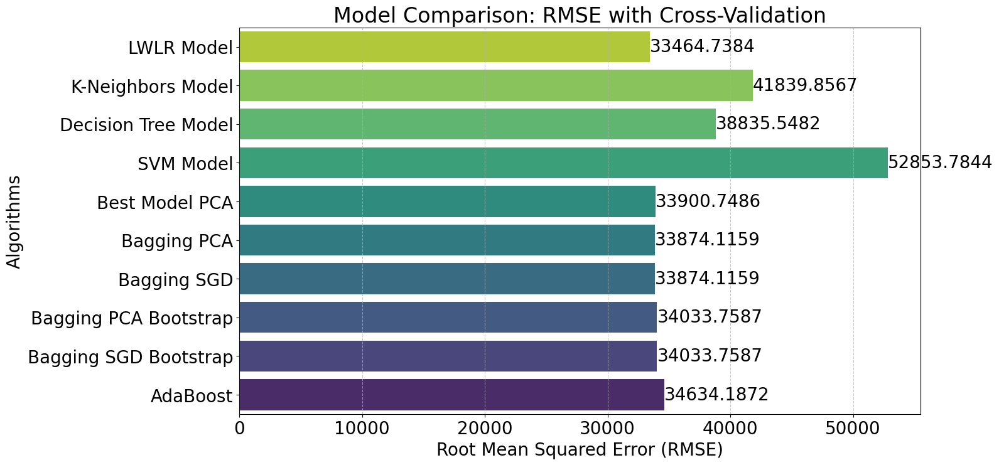

In [99]:
cv_results = evaluate_model_scores(models, arr_X, t)
plot_model_scores(cv_results)

**Based on this graph we can see which model has the best RMSE and we choose to  continou evaluating the following models:
    `ada_boost_model`,
     `bagging_model_SGD_bootstrap`,
    `bagging_model_pca_bootstrap`,
    `bagging_model_SGD`,
    `bagging_model_pca`,
   `best_model_PCA`.**

In [112]:
def get_cv_val_score(X, t, model, transformer=None,
                     k=None,
                     p=None,
                     show_score_loss_graphs=False,
                     use_rmse=False):
    """
    Calculate the validation score using cross-validation for a given model.
    
    Parameters:
    - X: Feature matrix
    - t: Target variable
    - model: Model to evaluate
    - transformer: Optional transformer (not used here)
    - k: Number of folds for KFold (if p is None)
    - p: Number of samples for LeavePOut (if k is None)
    - show_score_loss_graphs: Whether to show graphs for scores and losses
    - use_rmse: Whether to use RMSE instead of MSE for loss calculation

    Returns:
    - mean_val_score: Mean validation score
    """
    
    scores_df = pd.DataFrame(columns=['fold_id', 'score'])
    
    if k is not None:
        cv = KFold(n_splits=k, shuffle=True, random_state=42)
    elif p is not None:
        cv = LeavePOut(p)
    else:
        raise ValueError('You need to specify k or p in order for the CV to work')

    for i, (train_ids, val_ids) in enumerate(cv.split(X)):
        X_train = X.loc[train_ids]
        t_train = t.loc[train_ids]
        X_val = X.loc[val_ids]
        t_val = t.loc[val_ids]

        # Fit and predict
        model.fit(X_train, t_train)
        y_val = model.predict(X_val)
        
        # Calculate validation score
        val_score = model.score(X_val, t_val)
        
        # Assign results into scores df
        scores_df.loc[len(scores_df)] = [i, val_score]

    mean_val_score = scores_df['score'].mean()

    if show_score_loss_graphs:
        fig = px.line(scores_df, x='fold_id', y='score',
                      title=f'Mean Val Score: {mean_val_score:.2f}')
        fig.show()
        display(scores_df)

    return mean_val_score

In [130]:
from matplotlib.cm import ScalarMappable, get_cmap
from matplotlib.colors import Normalize

lowest_RMSE_models = {
    'AdaBoost': ada_boost_model,
    'Bagging SGD Bootstrap': bagging_model_SGD_bootstrap,
    'Bagging PCA Bootstrap': bagging_model_pca_bootstrap,
    'Bagging SGD': bagging_model_SGD,
    'Bagging PCA': bagging_model_pca,
    'Best Model PCA': best_model_PCA
}

# Define a dictionary to store validation scores
val_scores = {}

# Iterate over each model and calculate the validation score
for model_name, model in lowest_RMSE_models.items():
    mean_val_score = get_cv_val_score(X_Selected_FW_sgd, t, model, k=10, show_score_loss_graphs=False)
    val_scores[model_name] = mean_val_score

# Print validation scores for each model
for model_name, score in val_scores.items():
    print(f"{model_name}: {score:.4f}")


AdaBoost: 0.7950
Bagging SGD Bootstrap: 0.8071
Bagging PCA Bootstrap: 0.8071
Bagging SGD: 0.8081
Bagging PCA: 0.8081
Best Model PCA: 0.8011


we will go with the `Best Model PCA` model based on the RMSE and Val Score and all the evaluations we presented so far

## model prediction and submission

In [132]:
# create the submission file
submission['SalePrice'] = best_model_PCA.predict(test_Selected_FW_sgd)
submission.to_csv('submission.csv', index=False)
display(submission)

,Id,SalePrice
0,1461,117317.783496
1,1462,185298.991985
2,1463,178143.130329
3,1464,202945.564865
4,1465,186621.252579
...,...,...
1454,2915,85771.520395
1455,2916,78147.840509
1456,2917,180688.749318
1457,2918,120744.054921


**Screenshots**

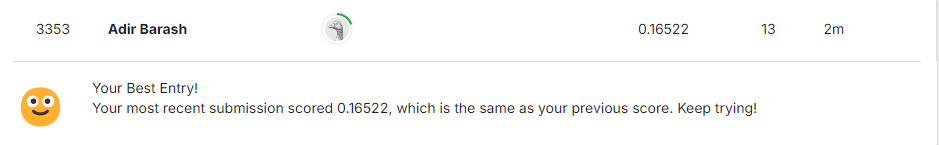

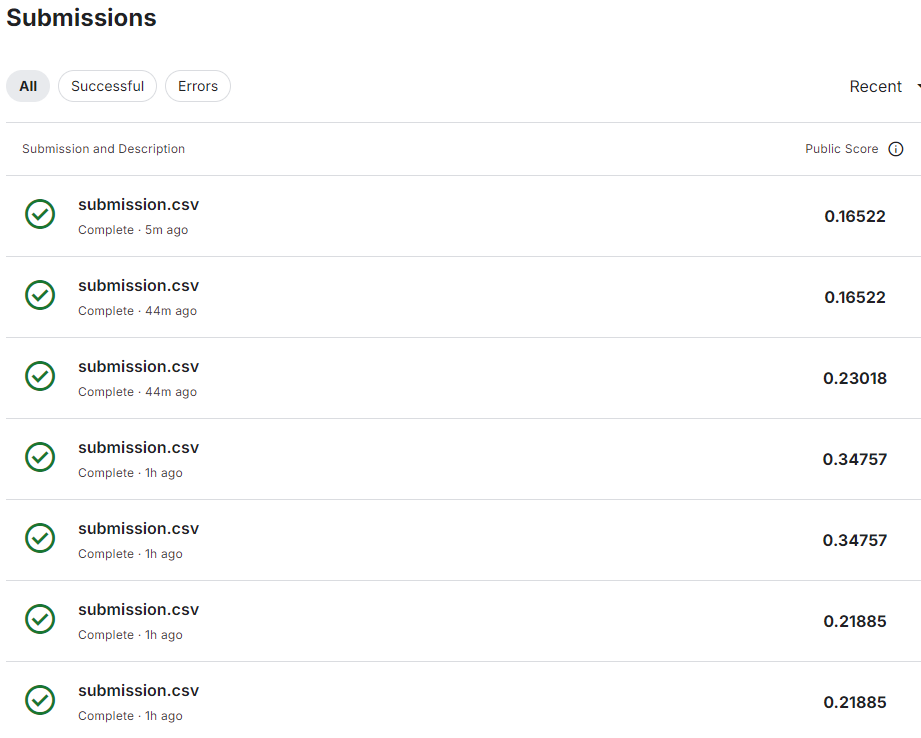

## **Summery**

The project initiated with an exploration of regression algorithms, including LWLR, KNN, Decision Trees, and SVM. Each model's performance was evaluated using RMSE and cross-validation, with results visualized through score and loss graphs.

**Dimensionality Reduction**


To address the dimensionality challenge, PCA was employed. The optimal number of principal components was determined to be 14.

**Ensemble Methods**


A range of ensemble techniques (Bagging, n-fold Bagging, Boosting) were combined with both original and PCA-transformed data, as well as the SGDRegressor. The performance of each ensemble configuration was assessed using RMSE and cross-validation, with results visualized graphically.

**Model Comparison and Selection**


A comprehensive evaluation of all developed models, including base models, ensembles, and PCA-based models, was conducted using RMSE and cross-validation. The top-performing models (AdaBoost, various Bagging variants, and the best PCA model) were shortlisted based on these metrics and visualized for comparison.

**Final Model Selection and Prediction**


Through in-depth analysis of validation scores, the 'Best Model PCA' was identified as the superior choice. This model was subsequently applied to generate predictions on the test dataset.

By consistently evaluating and visualizing model performance throughout the project, we were able to make informed decisions regarding model selection and improvement.

## **References**

Course Notebooks - moodle